# _BicAn_ Tutorial

This notebook is intended as an interactive guide to _Bicoherence Analyzer_, otherwise known as _BicAn_. We will take a tour of various uses of the software, attempting to highlight along the way its power and versatility.

_BicAn_ is designed to be useful in multiple ways: a flexible, [object-oriented](https://en.wikipedia.org/wiki/Object-oriented_programming) workstation for the bispectral analyst, a one stop shop for the neophyte, and a benchmarked solution for the average user. It is intentionally designed to be compatible with a [minimal Python installation](https://www.python.org/downloads/), _i.e._, dependency is limited to ``NumPy``, ``SciPy``, ``Matplotlib``, and ``TKinter``.

In addition to specializing in bicoherence analysis, _BicAn_ provides a rich suite of low-level signal processing tools. To ensure a coherent narrative throughout this tutorial, we will mostly ignore the minutiae of these low-level functions, as a more comprehensive documentation of these utilities is in development. Indeed, the presented class methods tacitly subsume much of this low-level infrastructure.

<!-- This approach mirrors the broad goals of an [object-oriented paradigm](https://en.wikipedia.org/wiki/Object-oriented_programming);  -->

_(Note that Git cheekily distinguishes high- and low-level commands with "porcelian" and "plumbing," respectively.)_

# Basics

While this notebook is a static object, it represents a set of instructions which may be altered or adapted to fit a myriad of analytic purposes.

Conveniently, only a single file is required to use _BicAn_ (``pybic.py``). While it isn't tiny $-$ nearly 3000 lines $-$ the extensible nature of the code, with few dependencies, is worth the hassle.

That said, any further development will likely prompt a dissemination of the code into submodules.

## Download source

The latest version of the _BicAn_ source code is available on [GitHub](https://github.com/rigzridge/pybic).

In a Unix environment, we can use ``wget`` to eliminate further legwork:

In [ ]:
!wget -O pybic.py https://raw.githubusercontent.com/rigzridge/pybic/main/pybic.py

--2024-05-27 20:25:43--  https://raw.githubusercontent.com/rigzridge/pybic/main/pybic.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 111435 (109K) [text/plain]
Saving to: ‘pybic.py’

pybic.py            100%[===================>] 108.82K  --.-KB/s    in 0.02s   

2024-05-27 20:25:43 (4.30 MB/s) - ‘pybic.py’ saved [111435/111435]



Note that using _BicAn_ is as simple as placing ``pybic.py`` into the desired directory!

## Import PyBic module

We're off to the races! Now all we have to include in our code is an ``import`` call to PyBic, the Python arm of _BicAn_:

In [ ]:
import pybic as bic

Of course, the ``PyBic`` module may be accessed from a different directory by appending to the local path, e.g.,

```
import sys
sys.path.append('/home/<directory with pybic.py>/')
```



## Test installation

To make sure everything is properly calibrated, we use a built-in test command, ``RunDemo()``:

Checking inputs...
Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  7%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 19%/^
 20%|"
 20%|:
 21%|.
 22%|_
 22%|.
 23%\:
 24%-"
 24%/^
 25%|"
 25%|:
 26%|.
 27%|_
 27%|.
 28%\:
 29%-"
 29%/^
 30%|"
 31%|:
 31%|.
 32%|_
 33%|.
 33%\:
 34%-"
 35%/^
 35%|"
 36%|:
 37%|.
 37%|_
 38%|.
 39%\:
 39%-"
 40%/^
 41%|"
 41%|:


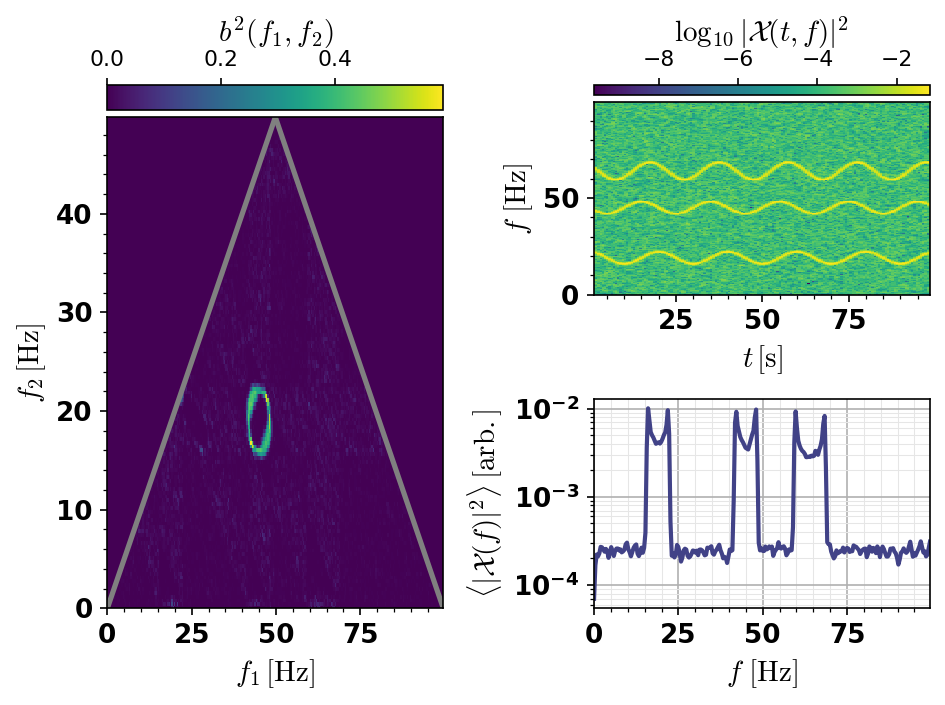

In [ ]:
bic.RunDemo()

## Analysis of diagnostic time series

Nice! All appears to be working. There is quite a bit of information in the above figure, so to peek under the hood a bit, we'll start simpler.

First, we create some data with the ``TestSignal()`` function:

In [ ]:
x, t, fS = bic.TestSignal('3tone')

Note that ``TestSignal`` outputs the data (``x``) and time (``t``) as [NumPy arrays](https://numpy.org/doc/stable/reference/generated/numpy.array.html), and the sampling rate (``fS``) as a float.

This diagnostic test signal (``'3tone'``) contains three sinusoids ~(19, 45, 64) Hz and a bit of random $[-1,1]$ noise. To analyze it, we use the ``BicAn`` method to create a _BicAn_ object.

In [ ]:
b = bic.BicAn(x,samprate=fS,justspec=True)

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  7%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 19%/^
 20%|"
 20%|:
 21%|.
 22%|_
 22%|.
 23%\:
 24%-"
 24%/^
 25%|"
 25%|:
 26%|.
 27%|_
 27%|.
 28%\:
 29%-"
 29%/^
 30%|"
 31%|:
 31%|.
 32%|_
 33%|.
 33%\:
 34%-"
 35%/^
 35%|"
 36%|:
 37%|.
 37%|_
 38%|.
 39%\:
 39%-"
 40%/^
 41%|"
 41%|:
 42%|.
 42%|_



Setting ``justspec=True`` provides two important features. First, the calculation time is substantially reduced by avoiding an estimation of the bicoherence spectrum. Because of this, the output to the ``PlotGUI()`` tool is suppressed.

For clarity, compare the above command with the output of
```
b = bic.BicAn(x,samprate=fS,plotit=False)
```

\In any case, _BicAn_ has now calculated the [short-time Fourier transform (STFT)](https://en.wikipedia.org/wiki/Short-time_Fourier_transform) of our test data, using the default subinterval of 512 samples, and default 128 sample step. To check that this is the case, we print

In [ ]:
print(b.SpecType)
print(b.SubInt)
print(b.Step)

stft
512
128


(To see _all_ attributes and methods, try ``dir(b)``.)

### Spectrogram

To visualize the frequency content vs. time, we use the ``PlotSpectro`` method to display a spectrogram:

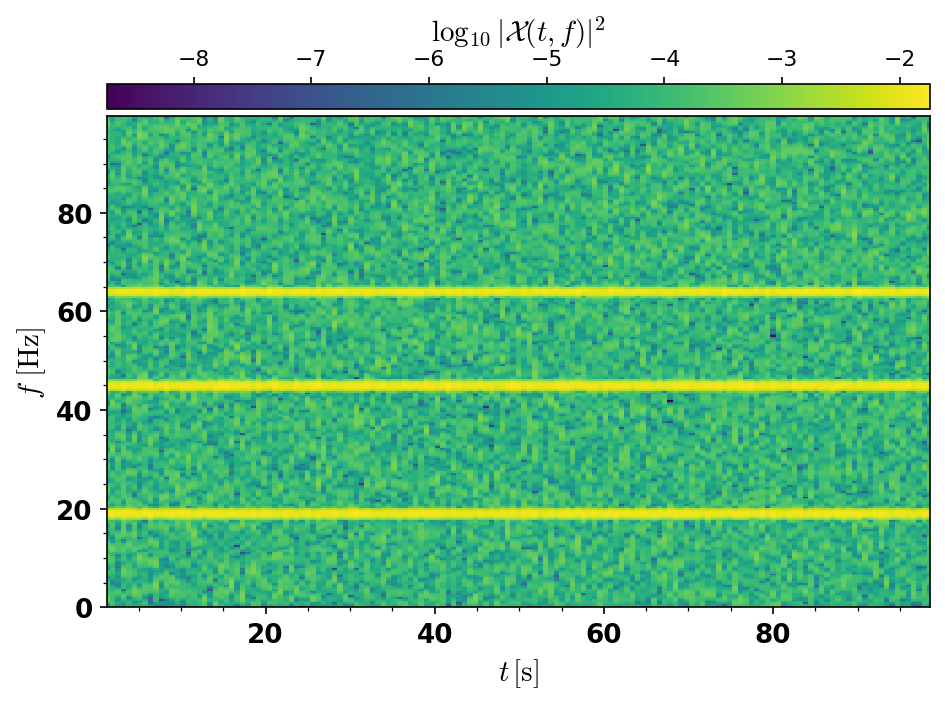

In [ ]:
b.PlotSpectro()

Notice that the STFT is mostly noise, except for the steady tones near 19, 45, and 64 Hz.

### Power spectral density

In this simple case, it is more revealing to plot the [power spectral density (PSD)](https://en.wikipedia.org/wiki/Spectral_density) with ``PlotPowerSpec()``:

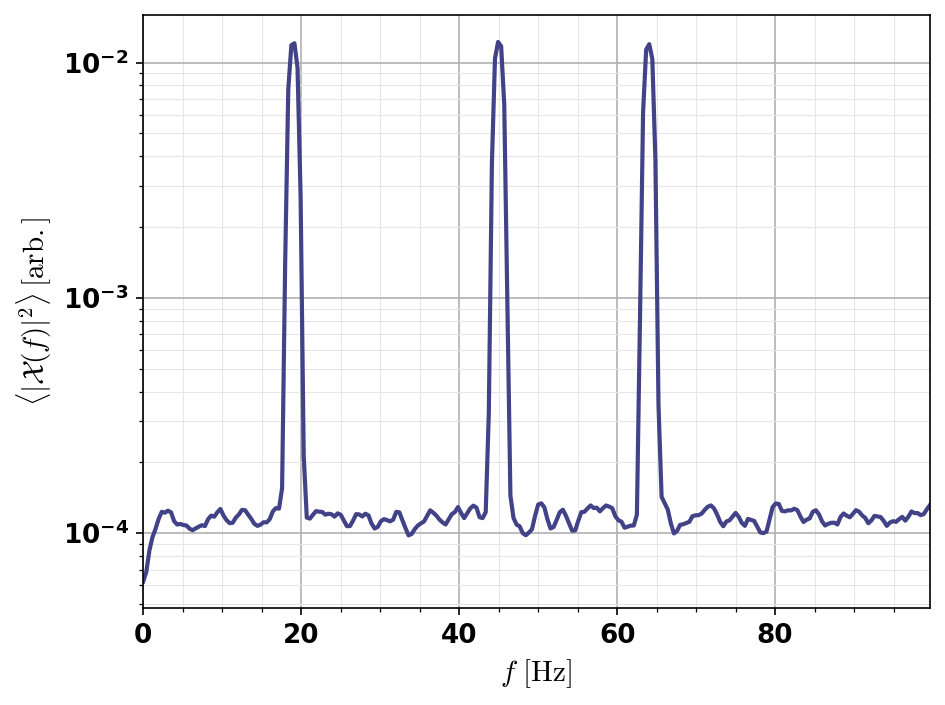

In [ ]:
b.PlotPowerSpec()

### Bicoherence spectrum

<!-- The bicoherence spectrum (if calculated) is displayed using the ``PlotBispec()`` method; however, setting ``justspec=True`` has prevented _BicAn_ from performing this calculation (try it and see!). -->
Similarly, the bicoherence spectrum is visualized with ``PlotBispec``. Of course, the ``justspec=True`` flag prevented _BicAn_ from actually calculating $\mathcal{B}(f_1,f_2)$ or $b^2(f_1,f_2)$, so we'll have to do it from scratch!

To compute it manually, we use the ``Bicoherence()`` method:

In [ ]:
b.Bicoherence()

Calculating bicoherence...      
  1%|_
  2%|.
  2%\:
  3%-"
  4%/^
  5%|"
  5%|:
  6%|.
  7%|_
  8%|.
  9%\:
  9%-"
 10%/^
 11%|"
 12%|:
 12%|.
 13%|_
 14%|.
 15%\:
 16%-"
 16%/^
 17%|"
 18%|:
 19%|.
 20%|_
 20%|.
 21%\:
 22%-"
 23%/^
 23%|"
 24%|:
 25%|.
 26%|_
 27%|.
 27%\:
 28%-"
 29%/^
 30%|"
 30%|:
 31%|.
 32%|_
 33%|.
 34%\:
 34%-"
 35%/^
 36%|"
 37%|:
 38%|.
 38%|_
 39%|.
 40%\:
 41%-"
 41%/^
 42%|"
 43%|:
 44%|.
 45%|_
 45%|.
 46%\:
 47%-"
 48%/^
 48%|"
 49%|:
 50%|.
 51%|_
 52%|.
 52%\:
 53%-"
 54%/^


Now ``PlotBispec()`` works perfectly! To ensure we view the full range ($b^2\in[0,1]$), we set ``normb2=True``:

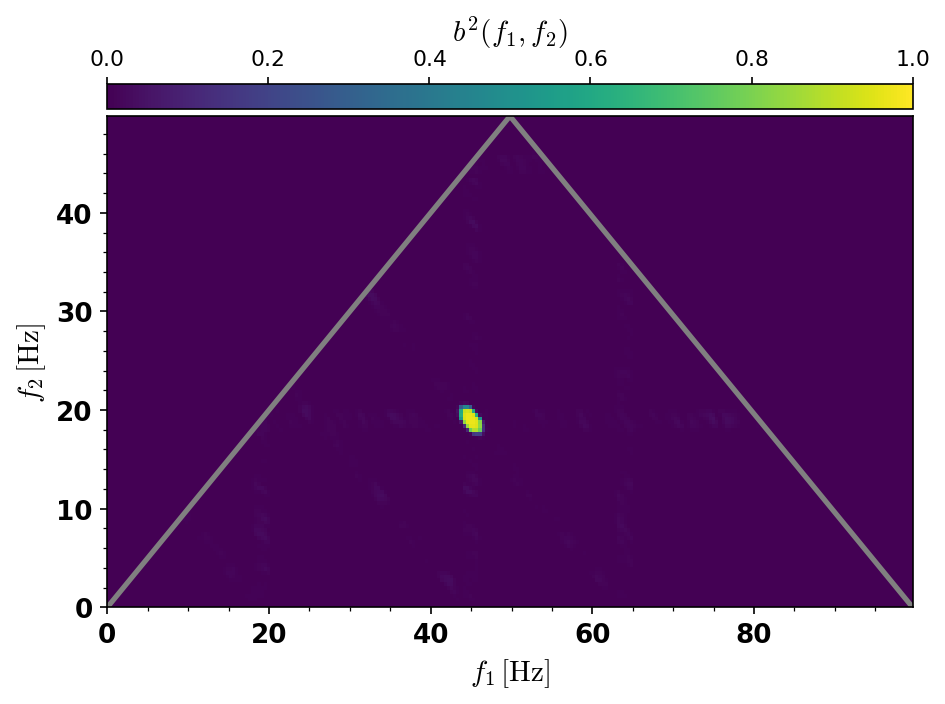

In [ ]:
b.PlotBispec(normb2=True)

As expected, there is a single peak near $(f_1,f_2)=(45,19)$ Hz.

In [ ]:
b.PlotDPI

150

## Colormaps, font size, plot labels, etc.

_BicAn_ allows the user to easily control the dots per inch (DPI), font size, colormap, colorbar position, etc. Furthermore, the ``FScale`` and ``TScale`` properties automatically handle the labeling of frequency and/or time axes. For example, to change the above plot to hectoseconds vs. deciHertz, we use

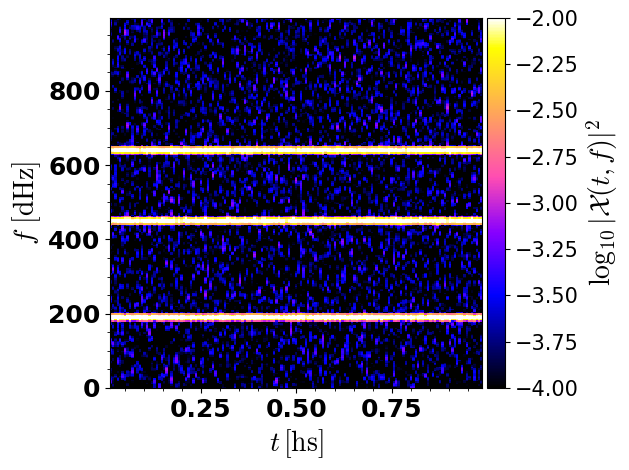

In [ ]:
b.PlotDPI = 100
b.FontSize = 20
b.CMap = 'gnuplot2'
b.CbarNorth = False
b.FScale = -1
b.TScale = 2
b.PlotSpectro(vLim=[-4,-2])

Note that the power spectral density and bicoherence spectrum are also automatically relabelled:

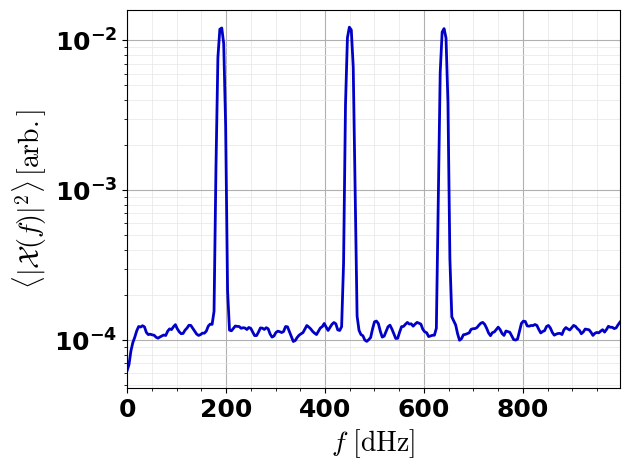

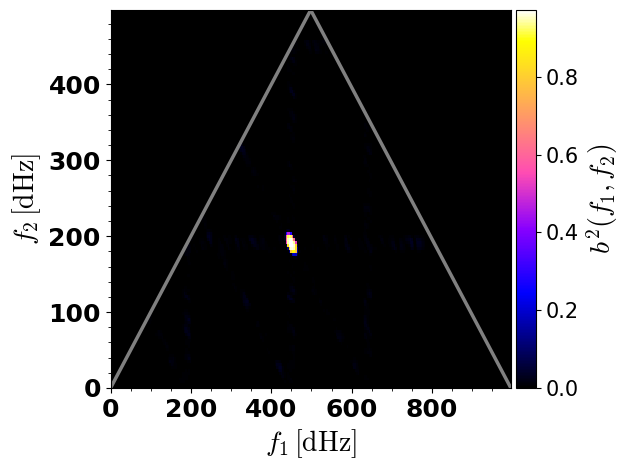

In [ ]:
b.PlotPowerSpec()
b.PlotBispec()

Of course, we may provide _BicAn_ with such preferences **before** calculating, e.g.,

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  7%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 19%/^
 20%|"
 20%|:
 21%|.
 22%|_
 22%|.
 23%\:
 24%-"
 24%/^
 25%|"
 25%|:
 26%|.
 27%|_
 27%|.
 28%\:
 29%-"
 29%/^
 30%|"
 31%|:
 31%|.
 32%|_
 33%|.
 33%\:
 34%-"
 35%/^
 35%|"
 36%|:
 37%|.
 37%|_
 38%|.
 39%\:
 39%-"
 40%/^
 41%|"
 41%|:
 42%|.
 42%|_


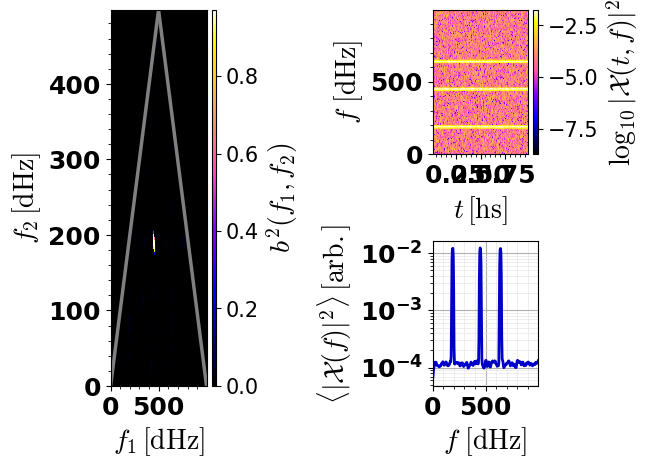

In [ ]:
b = bic.BicAn(x,samprate=fS,plotdpi=100,fontsize=20,
              cmap='gnuplot2',cbarnorth=False,fscale=-1,tscale=2)

Notice that the low DPI, large font and eastward colorbars lead to a rather busy plot.

To change the default settings for all BicAn objects, we address ``bic.BicAn.<attribute>``. For example, the colormap and font size are reintialized using
<!-- to ``'gnuplot2'`` using -->

In [ ]:
bic.BicAn.CMap = 'CMRmap'
bic.BicAn.FontSize = 14
bic.BicAn.Window = 'flat'

Now **all** _BicAn_ objects will be born with these settings.

Also, note that while there is **no case sensitivity for input flags**, it absolutely applies for attribute names. If we try to set ``b.fontsize``, we'll receive a warning:

In [ ]:
b.Fontsize = 30

***WARNING*** :: BicAn class has no attribute Fontsize!
Did you mean FontSize?


## Wavelet analysis

_BicAn_ affords users access to time-frequency representations in multiple ways. In particular, both the STFT and [continuous wavelet transform (CWT)](https://en.wikipedia.org/wiki/Continuous_wavelet_transform) are supported. To understand the CWT's utility, we truncate our time-series to 1024 samples:

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
 20%|_
 40%|.
 60%\:
 80%-"
100%/^
^]

Calculating bicoherence...      
  1%|_
  2%|.
  2%\:
  3%-"
  4%/^
  5%|"
  5%|:
  6%|.
  7%|_
  8%|.
  9%\:
  9%-"
 10%/^
 11%|"
 12%|:
 12%|.
 13%|_
 14%|.
 15%\:
 16%-"
 16%/^
 17%|"
 18%|:
 19%|.
 20%|_
 20%|.
 21%\:
 22%-"
 23%/^
 23%|"
 24%|:
 25%|.
 26%|_
 27%|.
 27%\:
 28%-"
 29%/^
 30%|"
 30%|:
 31%|.
 32%|_
 33%|.
 34%\:
 34%-"
 35%/^
 36%|"
 37%|:
 38%|.
 38%|_
 39%|.
 40%\:
 41%-"
 41%/^
 42%|"
 43%|:
 44%|.
 45%|_


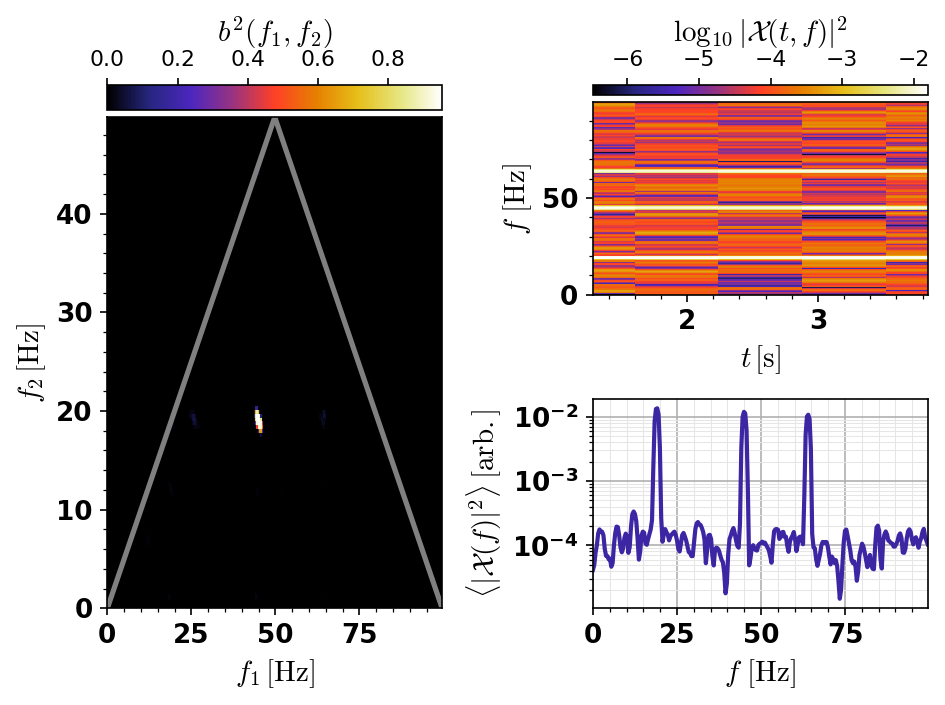

In [ ]:
x_short = x[0:1024]
b = bic.BicAn(x_short,samprate=fS)

_(Note that the frequency scale and colorbars have reset, but the colormap
and font size setting persist!)_

Evidently, the default subinterval and step (512 and 128 samples, respectively) yield only 5 subintervals in this case. Reducing the step size provides...
What's more, making the step size "too small" blurs the STFT and forms artifacts in the bicoherence spectrum:

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  2%|_
  3%|.
  5%\:
  6%-"
  8%/^
  9%|"
 11%|:
 12%|.
 14%|_
 15%|.
 17%\:
 18%-"
 20%/^
 22%|"
 23%|:
 25%|.
 26%|_
 28%|.
 29%\:
 31%-"
 32%/^
 34%|"
 35%|:
 37%|.
 38%|_
 40%|.
 42%\:
 43%-"
 45%/^
 46%|"
 48%|:
 49%|.
 51%|_
 52%|.
 54%\:
 55%-"
 57%/^
 58%|"
 60%|:
 62%|.
 63%|_
 65%|.
 66%\:
 68%-"
 69%/^
 71%|"
 72%|:
 74%|.
 75%|_
 77%|.
 78%\:
 80%-"
 82%/^
 83%|"
 85%|:
 86%|.
 88%|_
 89%|.
 91%\:
 92%-"
 94%/^
 95%|"
 97%|:
 98%|.
100%|_


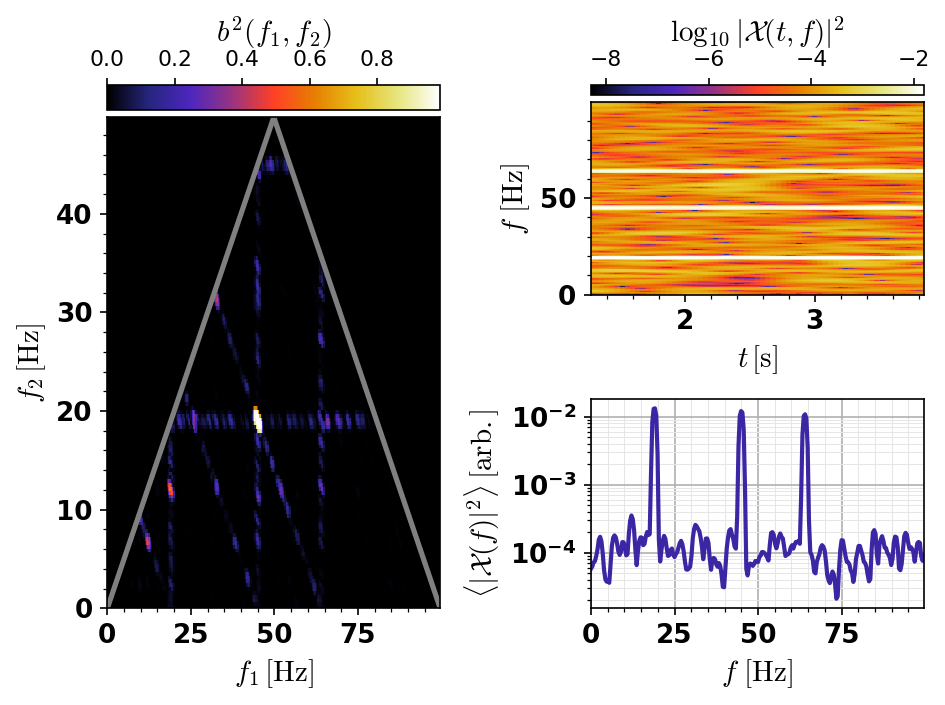

In [ ]:
b = bic.BicAn(x_short,samprate=fS,step=8)

### Wavelet bicoherence

However, using the CWT yields a clearer result

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying CWT...      
  0%|_
  0%|.
  1%\:
  1%-"
  1%/^
  1%|"
  1%|:
  2%|.
  2%|_
  2%|.
  2%\:
  2%-"
  3%/^
  3%|"
  3%|:
  3%|.
  3%|_
  4%|.
  4%\:
  4%-"
  4%/^
  4%|"
  4%|:
  5%|.
  5%|_
  5%|.
  5%\:
  5%-"
  6%/^
  6%|"
  6%|:
  6%|.
  6%|_
  7%|.
  7%\:
  7%-"
  7%/^
  7%|"
  8%|:
  8%|.
  8%|_
  8%|.
  8%\:
  9%-"
  9%/^
  9%|"
  9%|:
  9%|.
 10%|_
 10%|.
 10%\:
 10%-"
 10%/^
 11%|"
 11%|:
 11%|.
 11%|_
 11%|.
 12%\:
 12%-"
 12%/^
 12%|"
 12%|:
 12%|.
 13%|_


/content/pybic.py:983: RuntimeWarning: divide by zero encountered in log10
  im = ax.pcolormesh(t,f,2*np.log10(abs(self.sg[:,:,self.PlotSig]) + 0*1e-16), cmap=self.CMap, shading='auto')


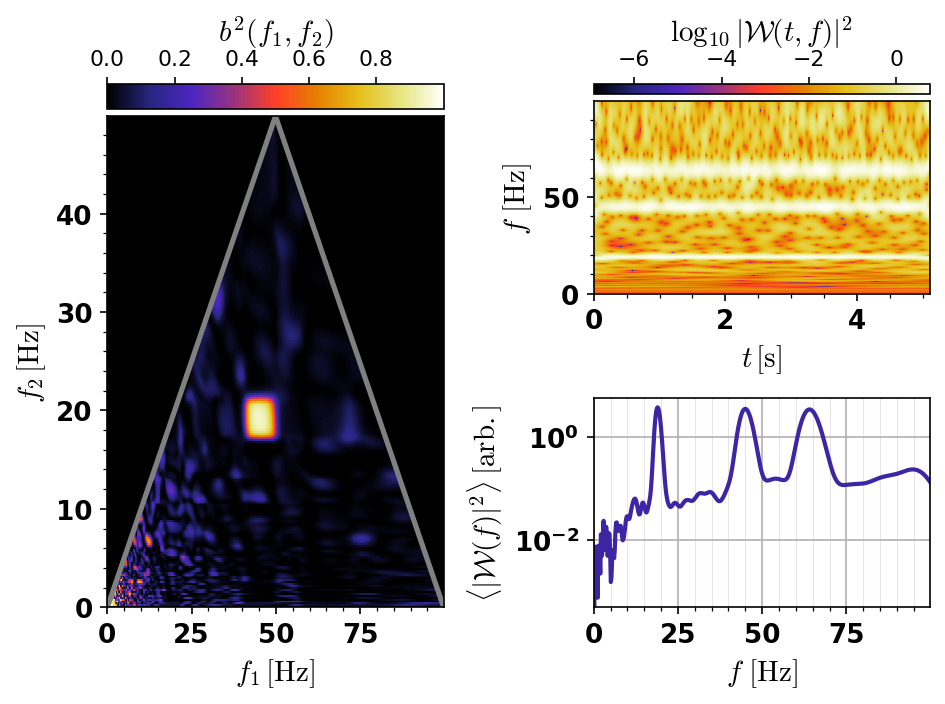

In [ ]:
b = bic.BicAn(x_short,samprate=fS,spectype='cwt')

Note that the peak value of bicoherence has broadened, but it is otherwise solitary in magnitude.

### Cone of influence

Calculating the "cone of influence" changes very little in this case:

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying CWT...      
  0%|_
  0%|.
  1%\:
  1%-"
  1%/^
  1%|"
  1%|:
  2%|.
  2%|_
  2%|.
  2%\:
  2%-"
  3%/^
  3%|"
  3%|:
  3%|.
  3%|_
  4%|.
  4%\:
  4%-"
  4%/^
  4%|"
  4%|:
  5%|.
  5%|_
  5%|.
  5%\:
  5%-"
  6%/^
  6%|"
  6%|:
  6%|.
  6%|_
  7%|.
  7%\:
  7%-"
  7%/^
  7%|"
  8%|:
  8%|.
  8%|_
  8%|.
  8%\:
  9%-"
  9%/^
  9%|"
  9%|:
  9%|.
 10%|_
 10%|.
 10%\:
 10%-"
 10%/^
 11%|"
 11%|:
 11%|.
 11%|_
 11%|.
 12%\:
 12%-"
 12%/^
 12%|"
 12%|:
 12%|.
 13%|_


/content/pybic.py:981: RuntimeWarning: divide by zero encountered in log10
  im = ax.pcolormesh(t,f,2*np.log10(abs(self.sg[:,:,self.PlotSig]) + 0*1e-16), cmap=self.CMap, shading='auto')


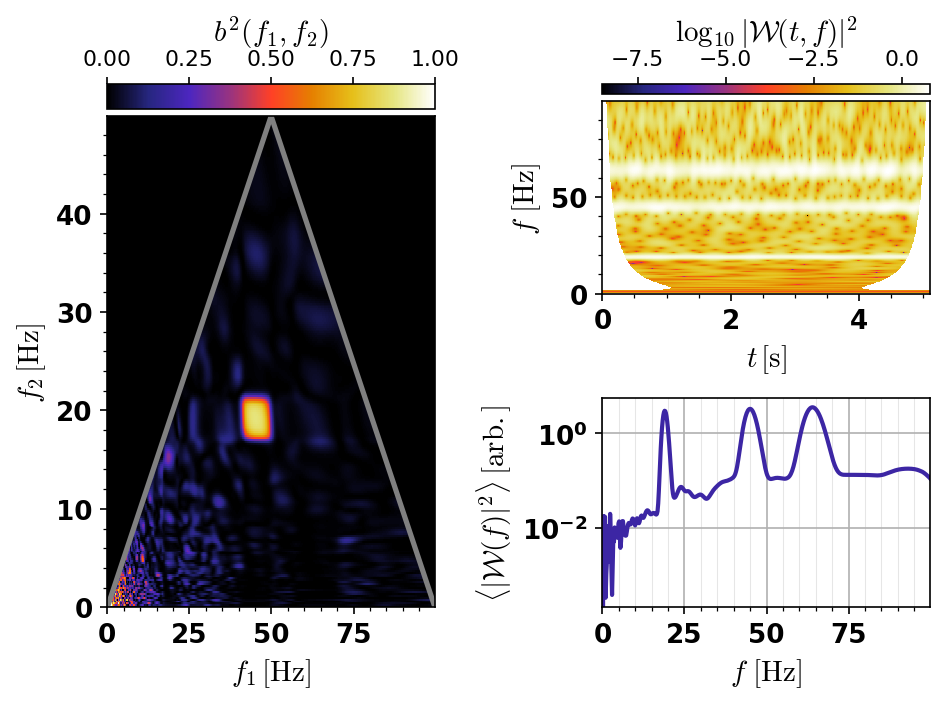

In [ ]:
b = bic.BicAn(x_short,samprate=fS,spectype='cwt',calccoi=True)

### CWT parameter space

In addition, the CWT allows finer control of simultaneous time and frequency resolution.
Note that in our implementation, the CWT includes two free parameters, since
$$
    \mathcal{W}[j,k] \propto
     k^{q-1/2}
        \sum_{p=0}^{N-1} \hat x[p]
    \exp \left[ -\frac{2\pi^2\sigma^2}{k^2} \left({p-k}
    \right)^2
    +\frac{2\pi ijp}{N}
    \right],
$$
where $\hat x$ is the discrete Fourier transform of time series $x$, and $j$ and $k$ represent time and frequency indices, respectively (_i.e._, $t_j = j\Delta t$ and $f_k = k/N\Delta t$).

<!-- Both $q$ and $\sigma$ are   -->
First, we consider changing the $q$ exponent, using the ``AlphaExp`` attribute:
<!-- Note that we define the CWT as
$$
\mathcal{W}(\alpha,\tau)
    = \pi^{1/4}\sqrt{{2\sigma }}
     \alpha^{q-1/2}
     \mathcal{F}^{-1}\left\{ \hat x(f)
    \exp \left[ -2\pi^2\sigma^2 \left(\frac{f}{\alpha}-f_0\right)^2 \right]  \right\}(\tau),
$$
where $\mathcal{F}^{-1}$ represents an inverse Fourier transform.
When discretized, this becomes
$$
    \mathcal{W}[j,k] =\pi^{1/4}\sqrt{{2\sigma }}
     k^{q-1/2}
        \sum_{p=0}^{N-1} \hat x[p]
    \exp \left[ -\frac{2\pi^2\sigma^2}{k^2} \left(\frac{p-k}{N\Delta t}
    \right)^2
    +\frac{2\pi ijp}{N}
    \right]
$$ -->

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying CWT...      
  0%|_
  0%|.
  1%\:
  1%-"
  1%/^
  1%|"
  1%|:
  2%|.
  2%|_
  2%|.
  2%\:
  2%-"
  3%/^
  3%|"
  3%|:
  3%|.
  3%|_
  4%|.
  4%\:
  4%-"
  4%/^
  4%|"
  4%|:
  5%|.
  5%|_
  5%|.
  5%\:
  5%-"
  6%/^
  6%|"
  6%|:
  6%|.
  6%|_
  7%|.
  7%\:
  7%-"
  7%/^
  7%|"
  8%|:
  8%|.
  8%|_
  8%|.
  8%\:
  9%-"
  9%/^
  9%|"
  9%|:
  9%|.
 10%|_
 10%|.
 10%\:
 10%-"
 10%/^
 11%|"
 11%|:
 11%|.
 11%|_
 11%|.
 12%\:
 12%-"
 12%/^
 12%|"
 12%|:
 12%|.
 13%|_


/content/pybic.py:981: RuntimeWarning: divide by zero encountered in log10
  im = ax.pcolormesh(t,f,2*np.log10(abs(self.sg[:,:,self.PlotSig]) + 0*1e-16), cmap=self.CMap, shading='auto')


Streaming output truncated to the last 5000 lines.
 31%/^
 31%|"
 31%|:
 31%|.
 31%|_
 32%|.
 32%\:
 32%-"
 32%/^
 32%|"
 33%|:
 33%|.
 33%|_
 33%|.
 33%\:
 34%-"
 34%/^
 34%|"
 34%|:
 34%|.
 35%|_
 35%|.
 35%\:
 35%-"
 35%/^
 36%|"
 36%|:
 36%|.
 36%|_
 36%|.
 37%\:
 37%-"
 37%/^
 37%|"
 37%|:
 38%|.
 38%|_
 38%|.
 38%\:
 38%-"
 38%/^
 39%|"
 39%|:
 39%|.
 39%|_
 39%|.
 40%\:
 40%-"
 40%/^
 40%|"
 40%|:
 41%|.
 41%|_
 41%|.
 41%\:
 41%-"
 42%/^
 42%|"
 42%|:
 42%|.
 42%|_
 43%|.
 43%\:
 43%-"
 43%/^
 43%|"
 44%|:
 44%

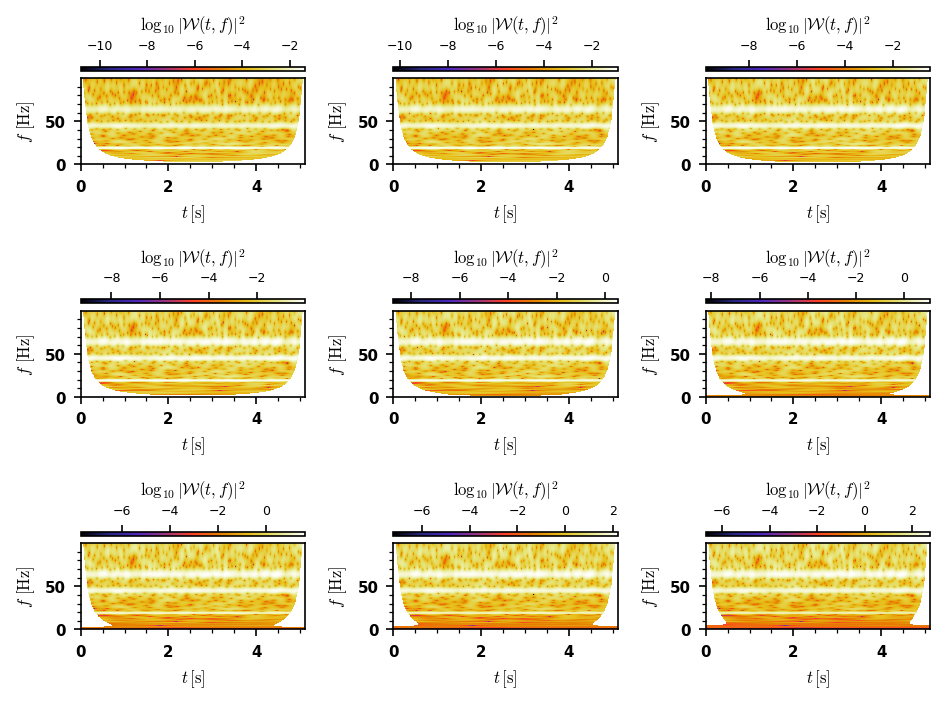

In [ ]:
# %%capture
import matplotlib.pyplot as plt
fig,ax=plt.subplots(dpi=b.PlotDPI,nrows=3,ncols=3)

for j in range(len(ax)):
  for k in range(len(ax)):
    g = 3*j+k
    b = bic.BicAn(x_short,samprate=fS,justspec=True,spectype='cwt',sizewarn=False,alphaexp=g/9,calccoi=True,fontsize=8)
    b.PlotSpectro(fig,ax[j][k],None)

plt.tight_layout()
plt.show()

Since $q$ appears only in the prefactor $k^{q-1/2}$, we observe changes in the relative amplitude of frequency bands (hence the default behavior is $q=1/2$). Due to this, the COI changes as well.

Next, we adjust the $\sigma$ parameter (via the ``Sigma`` attribute), which alters the effective time and frequency resolution:

Streaming output truncated to the last 5000 lines.
 31%/^
 31%|"
 31%|:
 31%|.
 31%|_
 32%|.
 32%\:
 32%-"
 32%/^
 32%|"
 33%|:
 33%|.
 33%|_
 33%|.
 33%\:
 34%-"
 34%/^
 34%|"
 34%|:
 34%|.
 35%|_
 35%|.
 35%\:
 35%-"
 35%/^
 36%|"
 36%|:
 36%|.
 36%|_
 36%|.
 37%\:
 37%-"
 37%/^
 37%|"
 37%|:
 38%|.
 38%|_
 38%|.
 38%\:
 38%-"
 38%/^
 39%|"
 39%|:
 39%|.
 39%|_
 39%|.
 40%\:
 40%-"
 40%/^
 40%|"
 40%|:
 41%|.
 41%|_
 41%|.
 41%\:
 41%-"
 42%/^
 42%|"
 42%|:
 42%|.
 42%|_
 43%|.
 43%\:
 43%-"
 43%/^
 43%|"
 44%|:
 44%

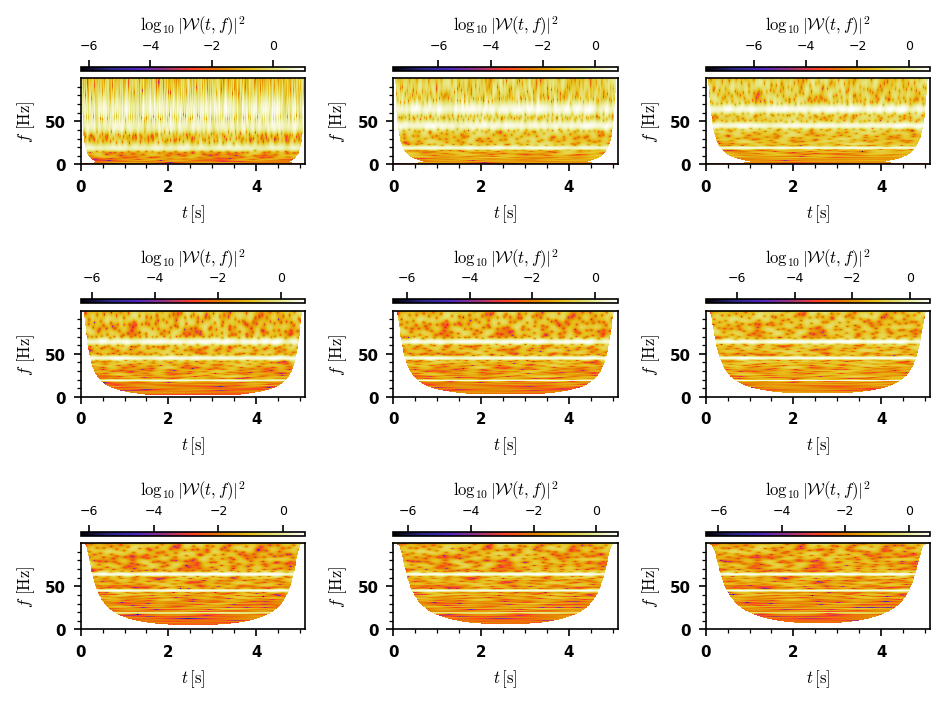

In [ ]:
# %%capture
fig,ax=plt.subplots(dpi=b.PlotDPI,nrows=3,ncols=3)

for j in range(len(ax)):
  for k in range(len(ax)):
    b = bic.BicAn(x_short,samprate=fS,justspec=True,spectype='cwt',sizewarn=False,sigma=float(3*j+k+1),calccoi=True,fontsize=8)
    b.PlotSpectro(fig,ax[j][k],None)

plt.tight_layout()
plt.show()

In this case, we see that a smaller value of $\sigma$ yields more time resolution, while a large value enhances frequency resolution.

Generally speaking, the user is invited to investigate the utility of changing $q$ and $\sigma$; however, in practice, the default values of $q=1/2$ and $\sigma\approx\pi$ are an excellent place to start!

# ``PlotGUI()`` primer

_BicAn_ provides a purpose-built visualization tool, ``PlotGUI()``. Until now, we have only used it implicitly (because the default behavior is ``JustSpec=False``), but it will prove useful to consider its features separately.

<!-- If we wanted to see all of this information from the get-go, we could've used -->
To start, compare the above plot with the following command, which re-calculates the spectrogram, power spectral density, and bicoherence spectrum:

Checking inputs...
Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  7%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 19%/^
 20%|"
 20%|:
 21%|.
 22%|_
 22%|.
 23%\:
 24%-"
 24%/^
 25%|"
 25%|:
 26%|.
 27%|_
 27%|.
 28%\:
 29%-"
 29%/^
 30%|"
 31%|:
 31%|.
 32%|_
 33%|.
 33%\:
 34%-"
 35%/^
 35%|"
 36%|:
 37%|.
 37%|_
 38%|.
 39%\:
 39%-"
 40%/^
 41%|"
 41%|:


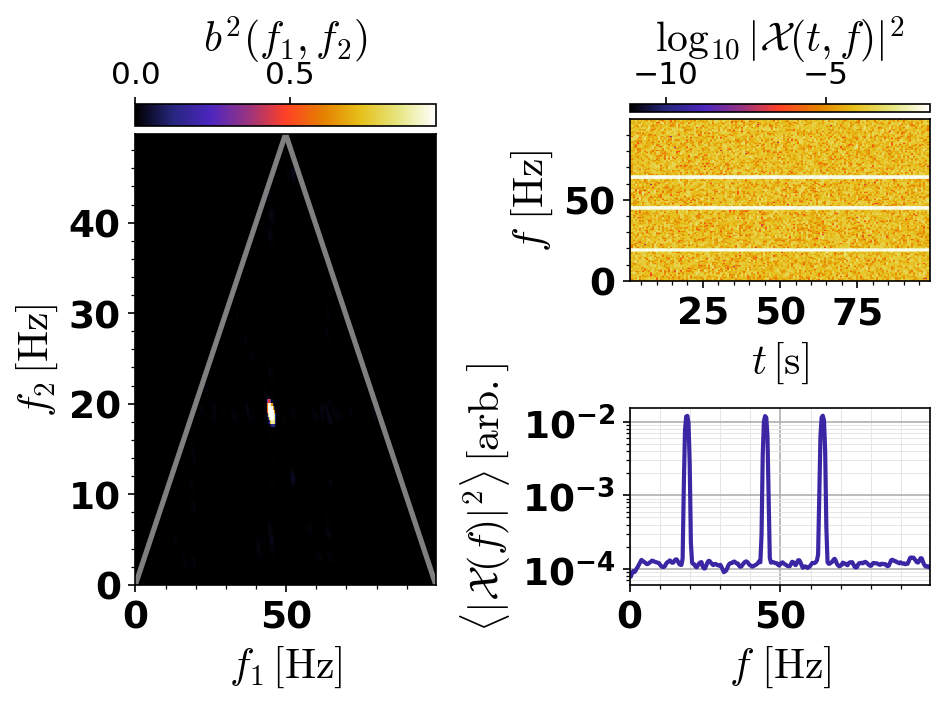

In [ ]:
b = bic.BicAn('3tone')

<!-- _(Note that the frequency scale and colorbars have reset, but the colormap
and font size setting persist.)_  -->
<!-- remains (``'gnuplot2'``)  -->
<!-- because we have altered the default settings in this session. -->
<!-- To change the default settings for all BicAn objects, we address ``bic.BicAn.<attribute>``. For example, the default colormap can be changed to ``'gnuplot2'`` using -->

## Hotkeys

Crucially, the ``PlotGUI()`` method provides an interactive figure when using _BicAn_ locally. Hotkeys are given by SHIFT + ``<char>``, where ``<char>``

*   ``b`` $\to$ Bicoherence spectrum
*   ``a`` $\to$ Bispectrum modulus
*   ``r`` $\to$ Real part of bispectrum
*   ``i`` $\to$ Imaginary part of bispectrum
*   ``p`` $\to$ Bispectrum phase
*   ``h`` $\to$ "Hybrid" plot, bicoherence $\times$ bispectrum phase

For example, using SHIFT + ``i`` changes the left plot (i.e., the bicoherence spectrum) to the imaginary part of the bispectrum $\mathcal{B}(f_1,f_2)$.
Unfortunately, in this notebook, we must recreate the behavior more crudely:

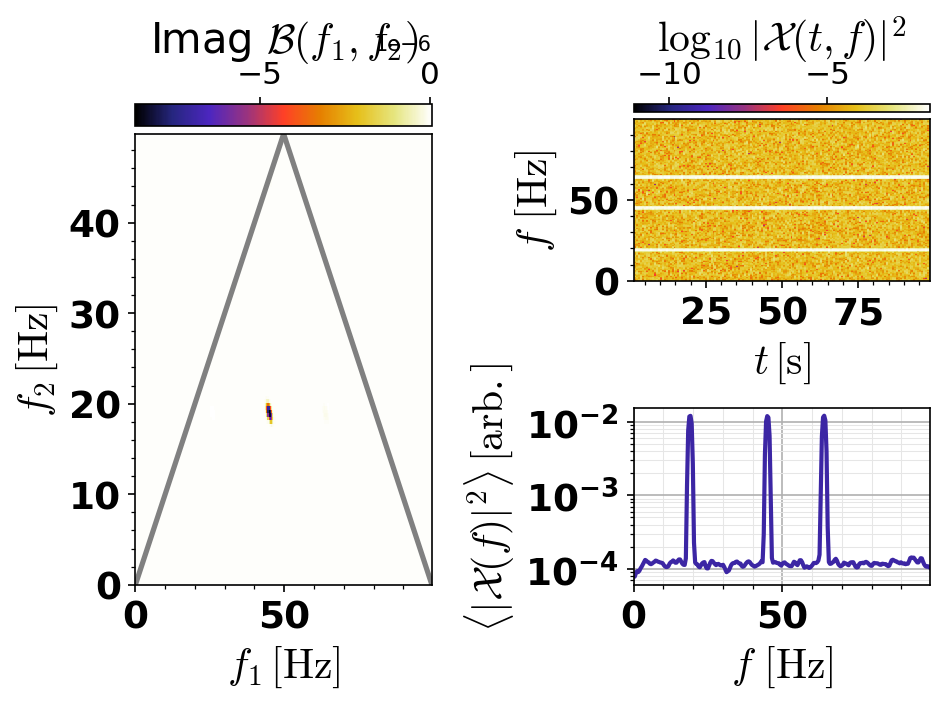

In [ ]:
b.PlotType = 'imag'
b.PlotGUI()

## Lineouts I

Furthermore, (left-)clicking on any point in the left plot presents an additional figure derived from the selected quantity. _We'll have to be a bit creative to replicate such bahvior in this notebook!_

First, we suppose that clicking on the peak makes the most sense. To return a local maximum in a given interval $\{(f_1,f_2):f_1\in[f_{x1},f_{x2}],f_2\in[f_{y1},f_{y2}]\}$, we use the ``FindMaxInRange()`` method:

In [ ]:
# Ir,Ic,maxVal = b.FindMaxInRange(fx1,fx2,fy1,fy2,useb2=True)
Ir,Ic,maxVal = b.FindMaxInRange(40,80,10,40)

Maximum found! Value is 0.9713 @ row = 49, column = 115
Scaled frequency equivalents are freqX = 44.92, freqY = 19.14


Now we'll be able to address the row and column implied by the "click" with ``Ir`` and ``Ic``, respectively.

### Bispectrum

For the modulus, phase angle, real, or imaginary parts of the bispectrum, clicking will produce a line-out.

Alternatively, we call the ``PlotPointOut()`` method to yield the desired figure:

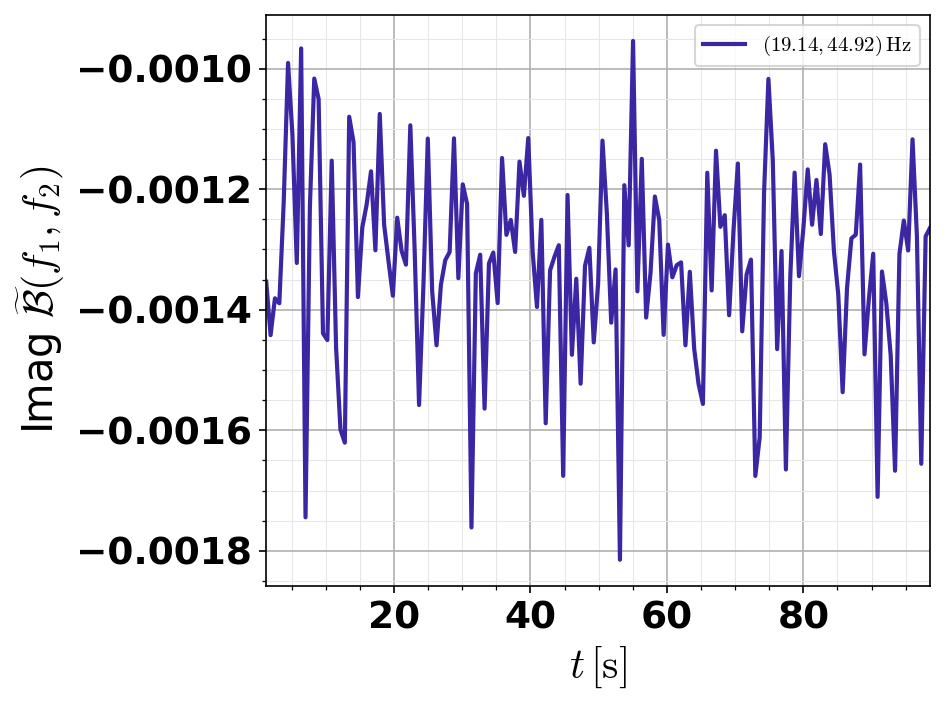

([49], [115])

In [ ]:
b.PlotPointOut(X=[Ir],Y=[Ic])

The modulus is given similarly. Note that ``PlotPointOut`` provides an ``IsFreq`` flag to assist the user when working programmatically. For example,

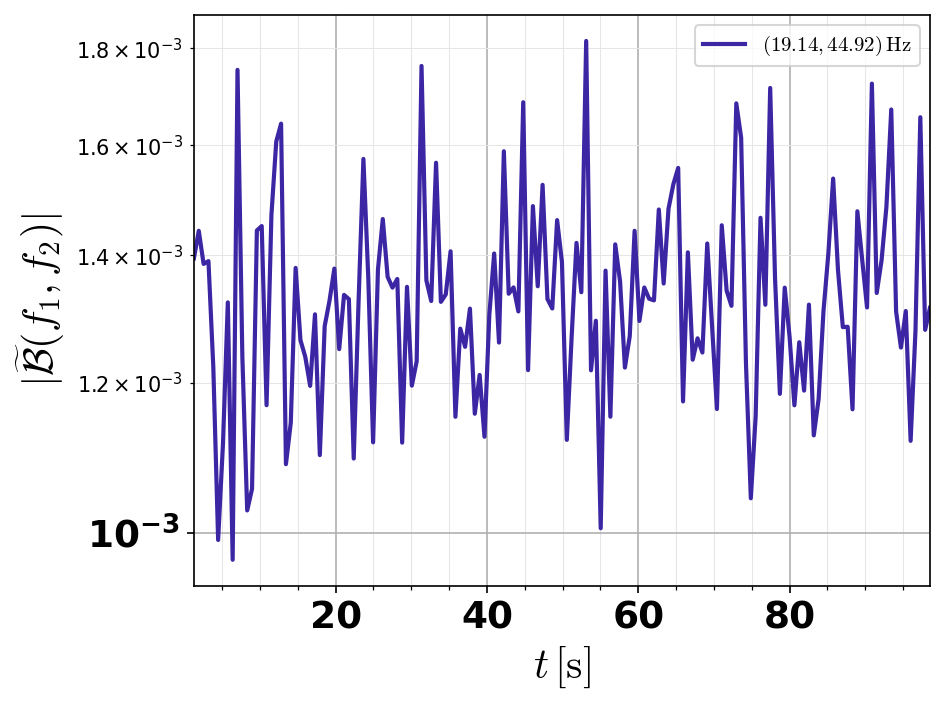

([49], [115])

In [ ]:
b.PlotType = 'abs'
b.PlotPointOut(X=[19],Y=[45],IsFreq=True) # Now using input in Hz

### Statistics & noise floor

To assess how statistically robust a given point in the bicoherence spectrum is, we use either SHIFT + ``b`` and click (there can be no time-resolution of a quantity aggregated over the entire window, after all!), or

Calculating distribution for $(19.14,44.92)\,\mathrm{Hz}$...      
  0%|_
  1%|.
  2%\:
  2%-"
  2%/^
  3%|"
  4%|:
  4%|.
  4%|_
  5%|.
  6%\:
  6%-"
  6%/^
  7%|"
  8%|:
  8%|.
  8%|_
  9%|.
 10%\:
 10%-"
 10%/^
 11%|"
 12%|:
 12%|.
 12%|_
 13%|.
 14%\:
 14%-"
 14%/^
 15%|"
 16%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 18%/^
 19%|"
 20%|:
 20%|.
 20%|_
 21%|.
 22%\:
 22%-"
 22%/^
 23%|"
 24%|:
 24%|.
 24%|_
 25%|.
 26%\:
 26%-"
 26%/^
 27%|"
 28%|:
 28%|.
 28%|_
 29%|.
 30%\:
 30%-"
 30%/^
 31%|"
 32%|:
 32%|.
 32%|_
 33%|.
 3

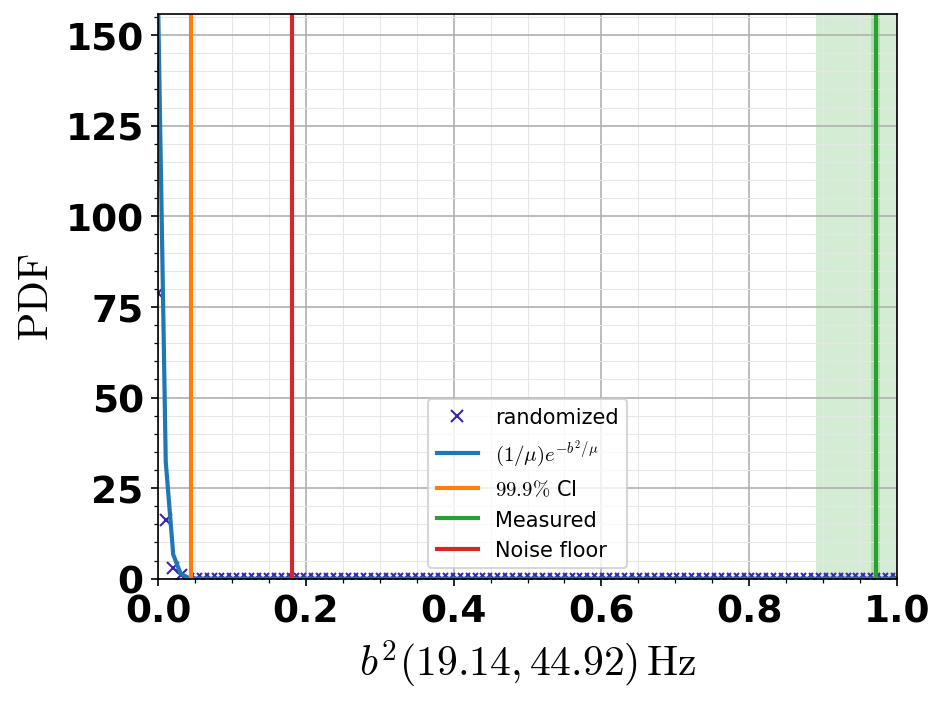

([49], [115])

In [ ]:
b.PlotType = 'bicoh'
b.PlotPointOut(X=[Ir],Y=[Ic])

We note that (as seen in the legend) the green line represents the measured value, the light green shaded region the sample uncertainty ($1/\sqrt{N}$), and the dark green shaded region the unweighted sample standard deviation. The blue curve is a fit which assumes an exponential distribution (_strictly speaking, this is equivalent to a chi-squred distribution with 2 d.o.f._), while the orange and red curves are the 99.9% confidence level in this distribution and the noise floor as given by either Fackrell or van Milligen.

### Phasor

A normalized phasor plot of the bispectrum is given when the user selects ``'hybrid'`. This will be utilized quite a bit in later discussion, and is replicated with

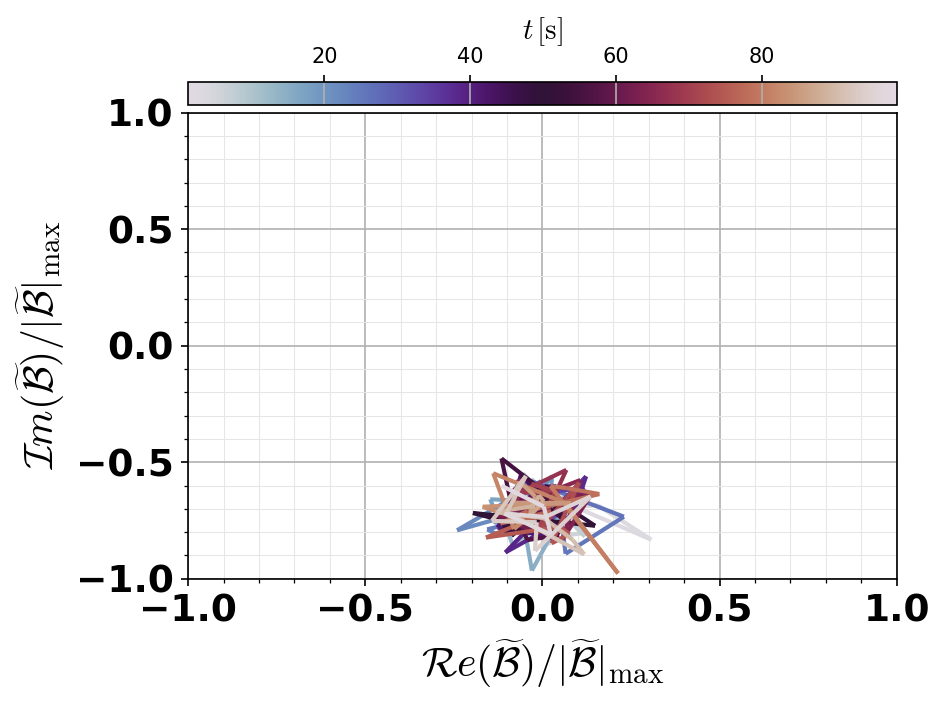

([48], [116])

In [ ]:
b.PlotType = 'hybrid'
b.PlotPointOut(X=[Ir],Y=[Ic])

Observe that in this simplified, static scenario, the bispectrum associated with the peak value of bicoherence is relatively time-independent.

### "Just plot everything!"

Conveniently, the information in most of these plots is easily consolidated by **right**-clicking, instead! _To replicate this in a script, simply use the ``PlotAll`` flag:_

Calculating distribution for $(19.14,44.92)\,\mathrm{Hz}$...      
  0%|_
  1%|.
  2%\:
  2%-"
  2%/^
  3%|"
  4%|:
  4%|.
  4%|_
  5%|.
  6%\:
  6%-"
  6%/^
  7%|"
  8%|:
  8%|.
  8%|_
  9%|.
 10%\:
 10%-"
 10%/^
 11%|"
 12%|:
 12%|.
 12%|_
 13%|.
 14%\:
 14%-"
 14%/^
 15%|"
 16%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 18%/^
 19%|"
 20%|:
 20%|.
 20%|_
 21%|.
 22%\:
 22%-"
 22%/^
 23%|"
 24%|:
 24%|.
 24%|_
 25%|.
 26%\:
 26%-"
 26%/^
 27%|"
 28%|:
 28%|.
 28%|_
 29%|.
 30%\:
 30%-"
 30%/^
 31%|"
 32%|:
 32%|.
 32%|_
 33%|.
 3

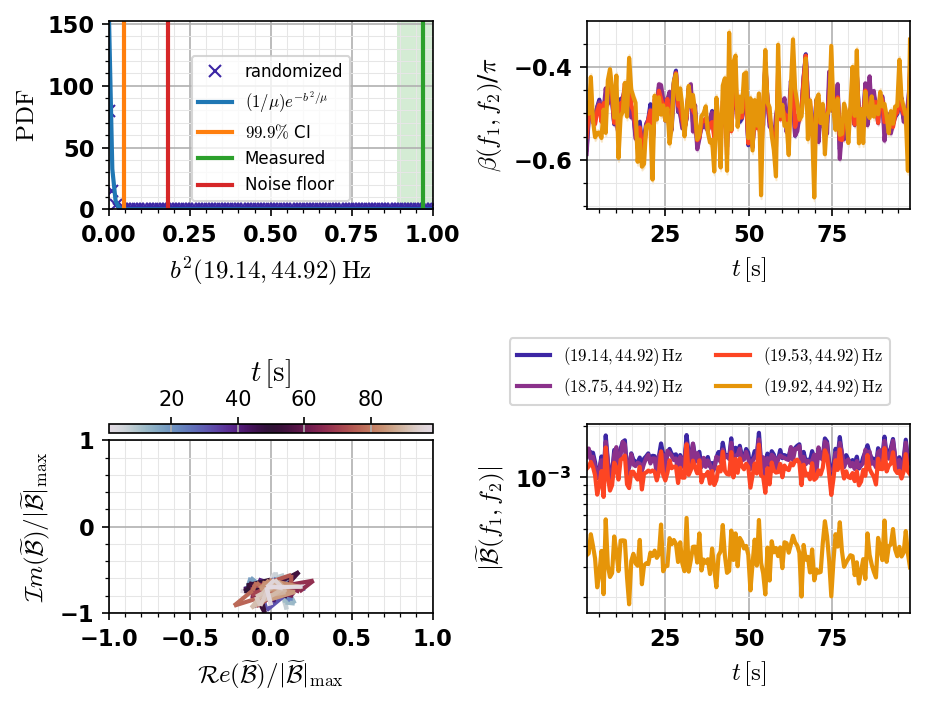

([49], [115])

In [ ]:
b.FontSize = 12
b.PlotPointOut(X=[Ir],Y=[Ic],PlotAll=True,CheckNeighbors=True)

Note that this plots also shows the phase angle and modulus of 3 points _near_ the selection, in order to give a feel for how "special" the point is in bi-frequency space.


## Lineouts II

In some sense, the former plots are kind of "boring" because nothing is really changing in time. For more "action," we use a simplified model of periodic quadratic coupling (see [this paper](https://doi.org/10.1063/5.0195036)) with

Checking inputs...
Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
done.
Applying STFT...      
  0%|_
  1%|.
  1%\:
  1%-"
  1%/^
  2%|"
  2%|:
  2%|.
  2%|_
  3%|.
  3%\:
  3%-"
  3%/^
  4%|"
  4%|:
  4%|.
  4%|_
  5%|.
  5%\:
  5%-"
  5%/^
  6%|"
  6%|:
  6%|.
  6%|_
  7%|.
  7%\:
  7%-"
  7%/^
  8%|"
  8%|:
  8%|.
  9%|_
  9%|.
  9%\:
  9%-"
 10%/^
 10%|"
 10%|:
 10%|.
 11%|_
 11%|.
 11%\:
 11%-"
 12%/^
 12%|"
 12%|:
 12%|.
 13%|_
 13%|.
 13%\:
 13%-"
 14%/^
 14%|"
 14%|:
 14%|.
 15%|_
 15%|.
 15%\:
 16%-"
 16%/^
 16%|"
 16%|:


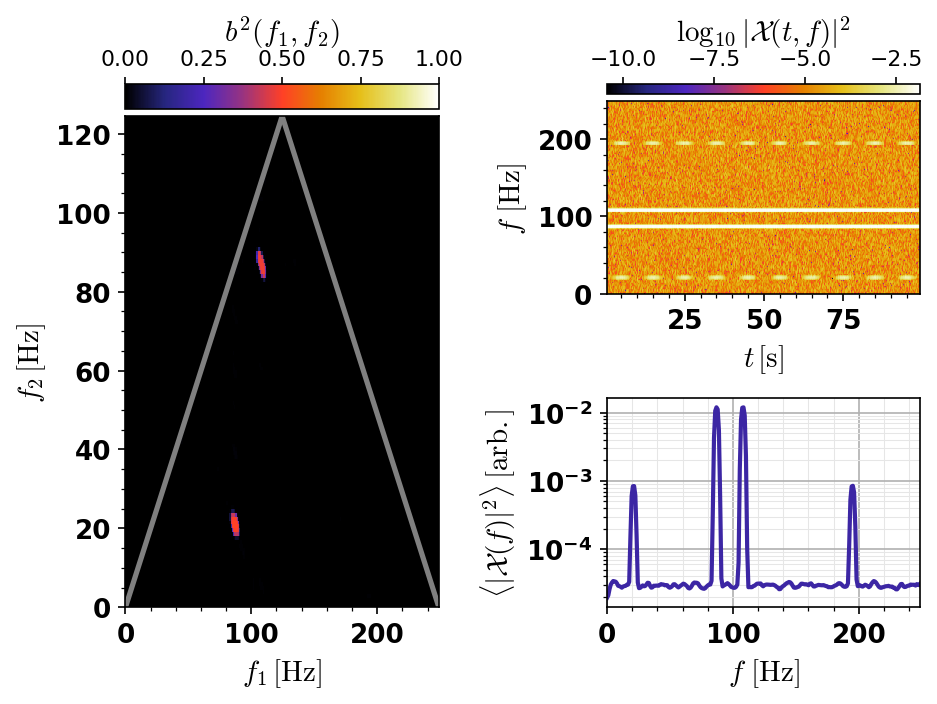

In [ ]:
b = bic.BicAn('d3dtest')

Observe that only the spectrogram hints at time-dependent behavior, while the bicoherence spectrum and PSD are indistinguishable from a static scenario.

To reproduce the effect of clicking on the lower feature, we use

In [ ]:
Ir,Ic,maxVal = b.FindMaxInRange(60,100,10,40)

Maximum found! Value is 0.5015 @ row = 21, column = 89
Scaled frequency equivalents are freqX = 86.91, freqY = 20.51


Now, the consolidated plot looks a good bit different:

Calculating distribution for $(20.51,85.94)\,\mathrm{Hz}$...      
  0%|_
  1%|.
  2%\:
  2%-"
  2%/^
  3%|"
  4%|:
  4%|.
  4%|_
  5%|.
  6%\:
  6%-"
  6%/^
  7%|"
  8%|:
  8%|.
  8%|_
  9%|.
 10%\:
 10%-"
 10%/^
 11%|"
 12%|:
 12%|.
 12%|_
 13%|.
 14%\:
 14%-"
 14%/^
 15%|"
 16%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 18%/^
 19%|"
 20%|:
 20%|.
 20%|_
 21%|.
 22%\:
 22%-"
 22%/^
 23%|"
 24%|:
 24%|.
 24%|_
 25%|.
 26%\:
 26%-"
 26%/^
 27%|"
 28%|:
 28%|.
 28%|_
 29%|.
 30%\:
 30%-"
 30%/^
 31%|"
 32%|:
 32%|.
 32%|_
 33%|.
 3

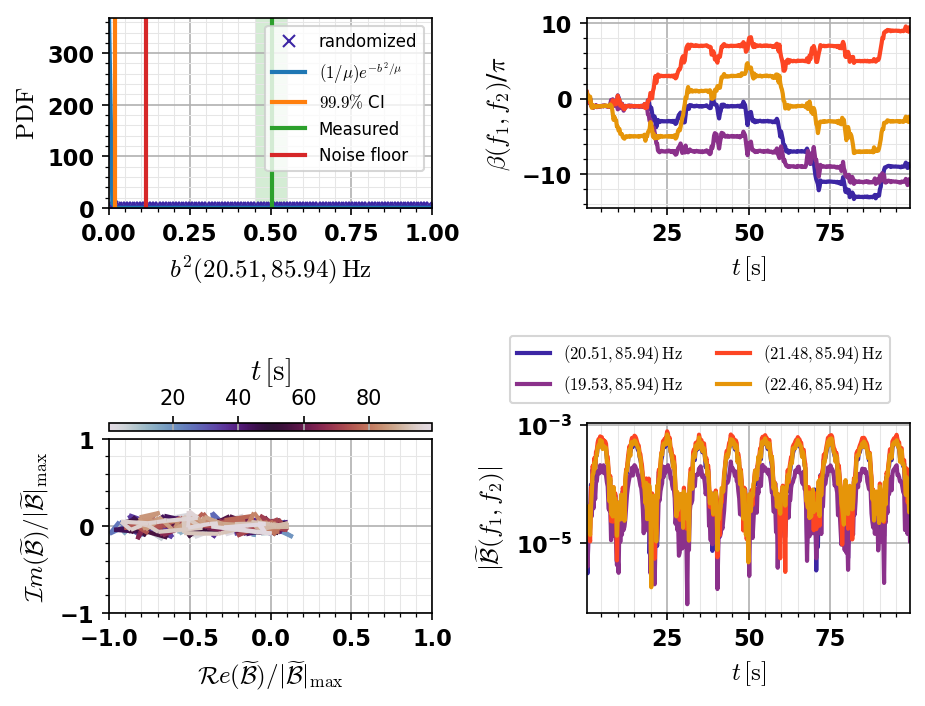

([21], [88])

In [ ]:
b.FontSize = 12
b.PlotPointOut(X=[Ir],Y=[Ic],PlotAll=True,CheckNeighbors=True)

## Selection of time interval

The spectrogram generated by ``PlotGUI()`` is also responsive to clicks. To see this, we first set ``NormBic=True``. Then, we consider 3 frequency-modulated (FM) sine waves, contrived such that the peak in the local bispectrum sweeps out a circle in bi-frequency space:

Checking inputs...
Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  7%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 19%/^
 20%|"
 20%|:
 21%|.
 22%|_
 22%|.
 23%\:
 24%-"
 24%/^
 25%|"
 25%|:
 26%|.
 27%|_
 27%|.
 28%\:
 29%-"
 29%/^
 30%|"
 31%|:
 31%|.
 32%|_
 33%|.
 33%\:
 34%-"
 35%/^
 35%|"
 36%|:
 37%|.
 37%|_
 38%|.
 39%\:
 39%-"
 40%/^
 41%|"
 41%|:


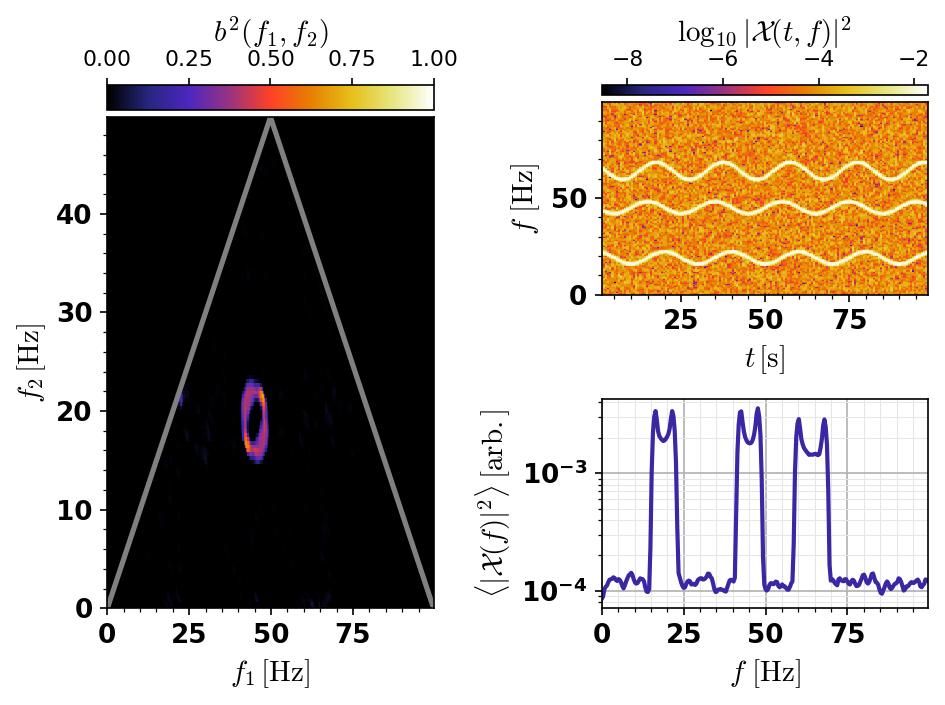

In [ ]:
bic.BicAn.NormBic = True
b = bic.BicAn('circle')

Now, the user may simply click the spectrogram to select a desired time interval. What happens next depends on the ``BicOfTime`` flag, but in all cases the PSD will be updated.

_Explicitly, ... when using the CWT... and for the STFT..._

To see the "bicoherence" associated with a given slice, use

Calculating bicoherence...      
  1%|_
  2%|.
  2%\:
  3%-"
  4%/^
  5%|"
  5%|:
  6%|.
  7%|_
  8%|.
  9%\:
  9%-"
 10%/^
 11%|"
 12%|:
 12%|.
 13%|_
 14%|.
 15%\:
 16%-"
 16%/^
 17%|"
 18%|:
 19%|.
 20%|_
 20%|.
 21%\:
 22%-"
 23%/^
 23%|"
 24%|:
 25%|.
 26%|_
 27%|.
 27%\:
 28%-"
 29%/^
 30%|"
 30%|:
 31%|.
 32%|_
 33%|.
 34%\:
 34%-"
 35%/^
 36%|"
 37%|:
 38%|.
 38%|_
 39%|.
 40%\:
 41%-"
 41%/^
 42%|"
 43%|:
 44%|.
 45%|_
 45%|.
 46%\:
 47%-"
 48%/^
 48%|"
 49%|:
 50%|.
 51%|_
 52%|.
 52%\:
 53%-"
 54%/^


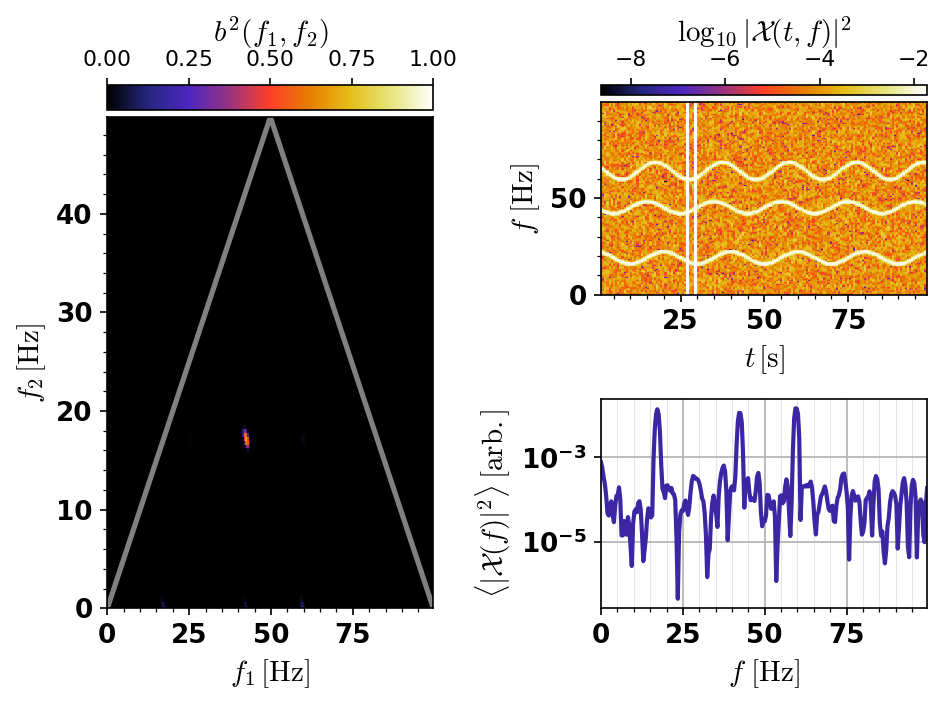

In [ ]:
b.PlotSlice = 40
b.BicOfTime = True
b.PlotGUI()

_Note that the arrow keys will scrub through the spectrogram._

To recreate the data exploration enabled by this feature, we produce an animation:

In [ ]:
from matplotlib import rc, animation
rc('animation', html='jshtml')

def update(t):
# ------------------
# Dummy function for animation
# ------------------
  b.PlotSlice = t
  b.RefreshGUI()

# ani = animation.FuncAnimation(b.Figure, update, frames=len(b.tv), interval=50, blit=False)
ani = animation.FuncAnimation(b.Figure, update, frames=30, interval=50, blit=False)

b.BicOfTime = True

The actual frames are created by:

In [ ]:
%%capture
# This ^^^ command suppresses the copious output
ani

And, because the output was supressed, we view it with

In [ ]:
ani

For completeness, we investigate a single point on the circle more closely:
<!-- Of course, the typical user will likely not make an animation, but instead click through the spectrogram... -->

Calculating distribution for $(46.09,16.02)\,\mathrm{Hz}$...      
  0%|_
  1%|.
  2%\:
  2%-"
  2%/^
  3%|"
  4%|:
  4%|.
  4%|_
  5%|.
  6%\:
  6%-"
  6%/^
  7%|"
  8%|:
  8%|.
  8%|_
  9%|.
 10%\:
 10%-"
 10%/^
 11%|"
 12%|:
 12%|.
 12%|_
 13%|.
 14%\:
 14%-"
 14%/^
 15%|"
 16%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 18%/^
 19%|"
 20%|:
 20%|.
 20%|_
 21%|.
 22%\:
 22%-"
 22%/^
 23%|"
 24%|:
 24%|.
 24%|_
 25%|.
 26%\:
 26%-"
 26%/^
 27%|"
 28%|:
 28%|.
 28%|_
 29%|.
 30%\:
 30%-"
 30%/^
 31%|"
 32%|:
 32%|.
 32%|_
 33%|.
 3

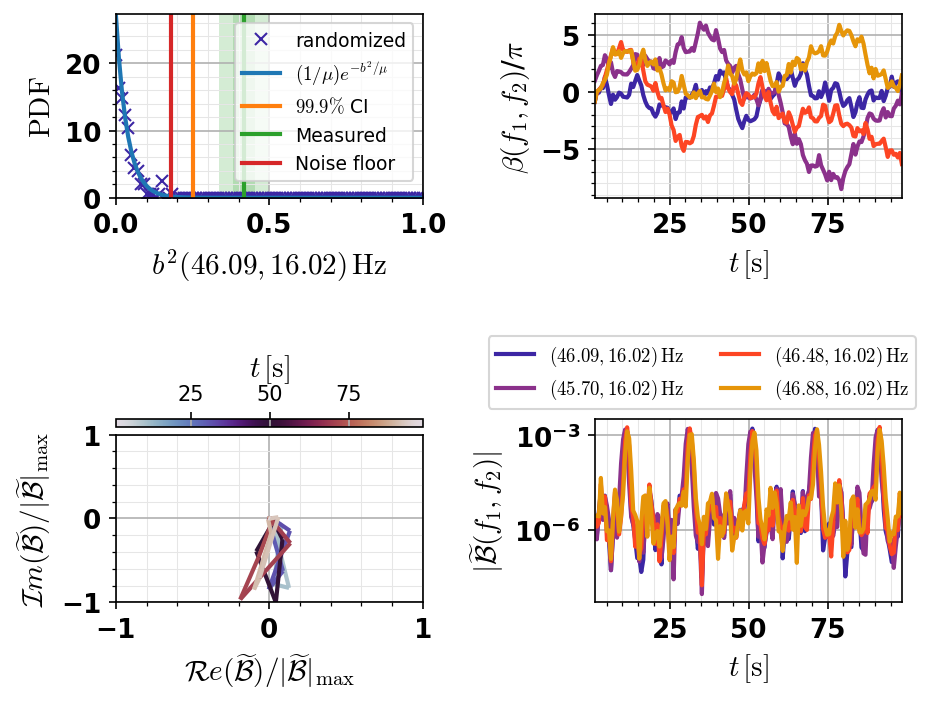

In [ ]:
Ir,Ic = b.PlotPointOut(X=[46],Y=[16],IsFreq=True,PlotAll=True,CheckNeighbors=True)

_Note that there are phase-randomized points which exceed the noise floor! This demonstrates the importance of a holistic outlook when applying bispectral analysis!_

# "Advanced" features

For many uses, the above utilities will be more than sufficient. However, for more involved analyses, _BicAn_ supplies a powerful assortment of methods to assist in solving signal-processing problems.

## Cross-bispectral analysis

_BicAn_ also supports the simultaneous analysis of multiple time-series. As usual, we appeal to an inbuilt test signal:

In [ ]:
x, t, fS = bic.TestSignal('cross_circle')

Effectively, this signal separates the 3 FM tones given by the ``'circle'`` demo into 3 mutually exclusive channels. Note that now, ``x`` is a NumPy array with shape

In [ ]:
print(x.shape)

(20000, 3)


_BicAn_ conveniently handles input parsing, so that upon detection of an array with "short" dimension > 1, the cross-bicoherence is automatically calculated:

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  7%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 19%/^
 20%|"
 20%|:
 21%|.
 22%|_
 22%|.
 23%\:
 24%-"
 24%/^
 25%|"
 25%|:
 26%|.
 27%|_
 27%|.
 28%\:
 29%-"
 29%/^
 30%|"
 31%|:
 31%|.
 32%|_
 33%|.
 33%\:
 34%-"
 35%/^
 35%|"
 36%|:
 37%|.
 37%|_
 38%|.
 39%\:
 39%-"
 40%/^
 41%|"
 41%|:
 42%|.
 42%|_


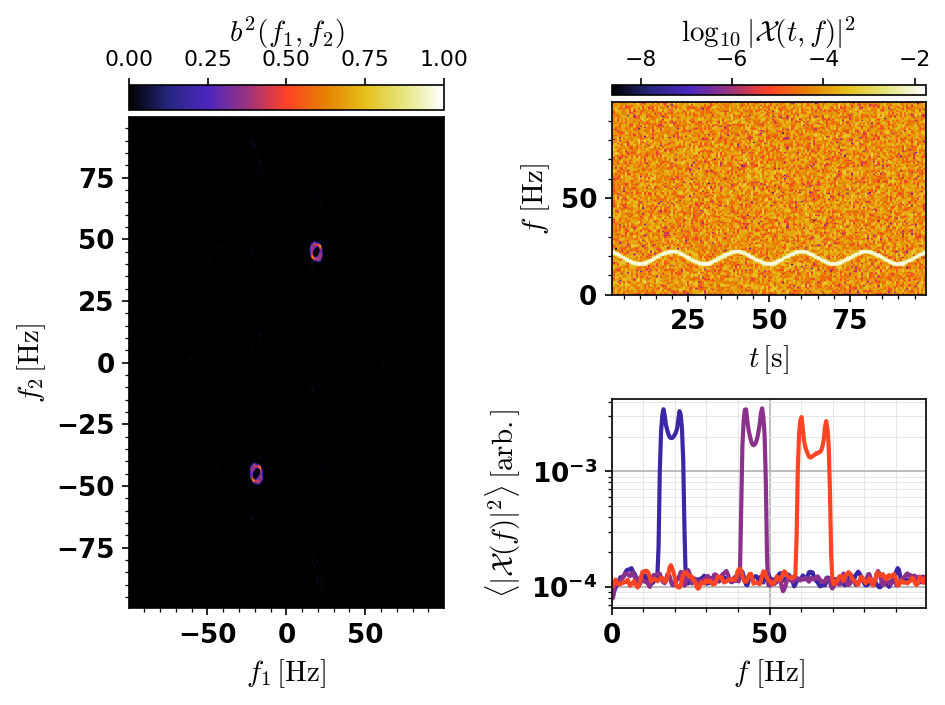

In [ ]:
b = bic.BicAn(x,samprate=fS)

We observe a few key differences. Specifically, we see that  

*   The bicoherence spectrum uses a larger range than before (_note the conjugate peak in the third quadrant!_)
*   The spectrogram presents only data from the first channel, and
*   The PSD plots all channels

For those interacting with PyBic locally, using SHIFT + ``1``, ``2``, or ``3`` changes the channel plotted by ``PlotSpectro()``. Here, we use

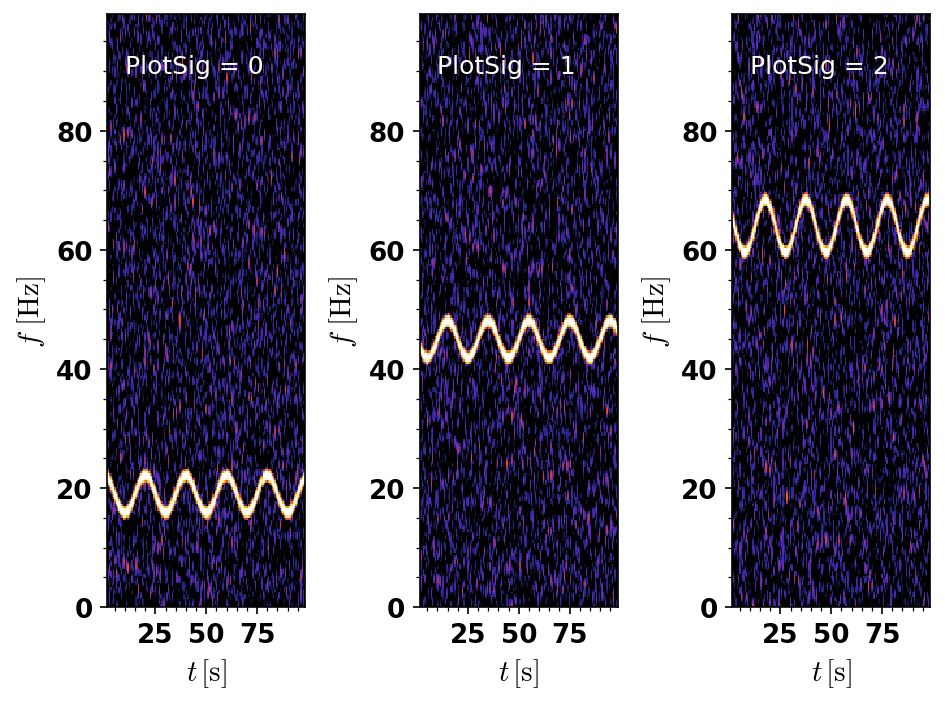

In [ ]:
import matplotlib.pyplot as plt
fig, axvec = plt.subplots(dpi=b.PlotDPI, ncols=3, squeeze=True)
for k in range(3):
  b.PlotSig = k
  b.PlotSpectro(fig,axvec[k],vLim=[-4,-2])

  axvec[k].text(0.1 * b.tv[-1]/10**b.TScale, 0.9 * b.fv[-1]/10**b.FScale, 'PlotSig = %d' % k,color='white',fontsize=12)

fig.tight_layout()
plt.show()

In the case of a "short" time-series ($N\leq2048$ samples, say), a wavelet-based cross-bicoherence analysis might be necessary. _Of course, BicAn does not prevent the user from estimating CWT-based bicoherence spectra for larger time-series, but the required calculation time may be unacceptable!_

In any case, a CWT-based cross-bicoherence analysis is performed with

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying CWT...      
  0%|_
  0%|.
  1%\:
  1%-"
  1%/^
  1%|"
  1%|:
  2%|.
  2%|_
  2%|.
  2%\:
  2%-"
  3%/^
  3%|"
  3%|:
  3%|.
  3%|_
  4%|.
  4%\:
  4%-"
  4%/^
  4%|"
  4%|:
  5%|.
  5%|_
  5%|.
  5%\:
  5%-"
  6%/^
  6%|"
  6%|:
  6%|.
  6%|_
  7%|.
  7%\:
  7%-"
  7%/^
  7%|"
  8%|:
  8%|.
  8%|_
  8%|.
  8%\:
  9%-"
  9%/^
  9%|"
  9%|:
  9%|.
 10%|_
 10%|.
 10%\:
 10%-"
 10%/^
 11%|"
 11%|:
 11%|.
 11%|_
 11%|.
 12%\:
 12%-"
 12%/^
 12%|"
 12%|:
 12%|.
 13%|_


/content/pybic.py:981: RuntimeWarning: divide by zero encountered in log10
  im = ax.pcolormesh(t,f,2*np.log10(abs(self.sg[:,:,self.PlotSig]) + 0*1e-16), cmap=self.CMap, shading='auto')


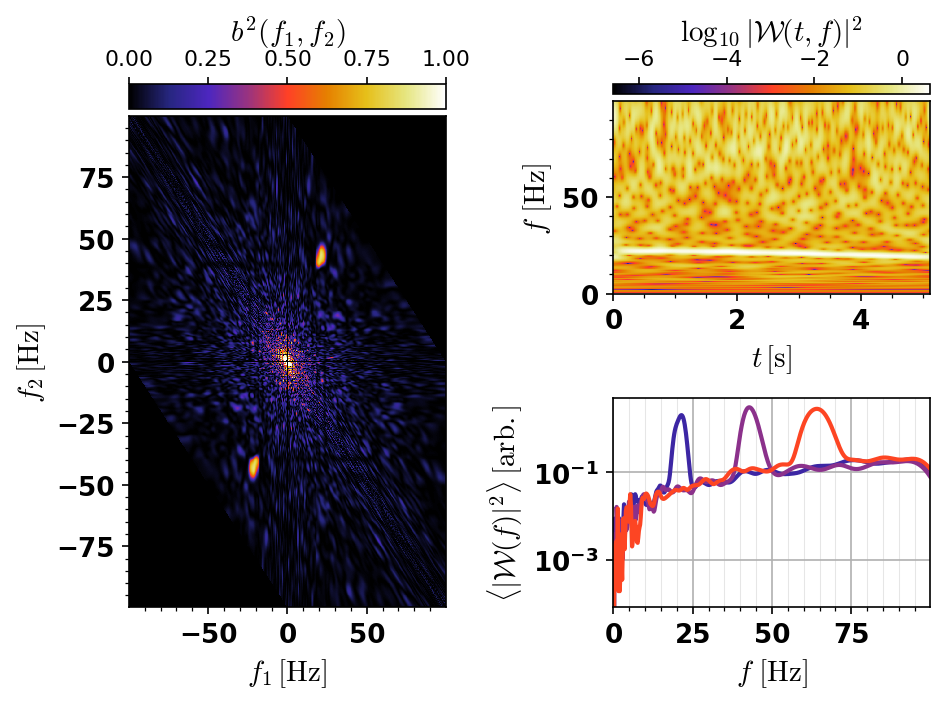

In [ ]:
b = bic.BicAn(x[0:1024,:],samprate=fS,spectype='cwt')

Note the time required!

Recycling our earlier code yields similar results:

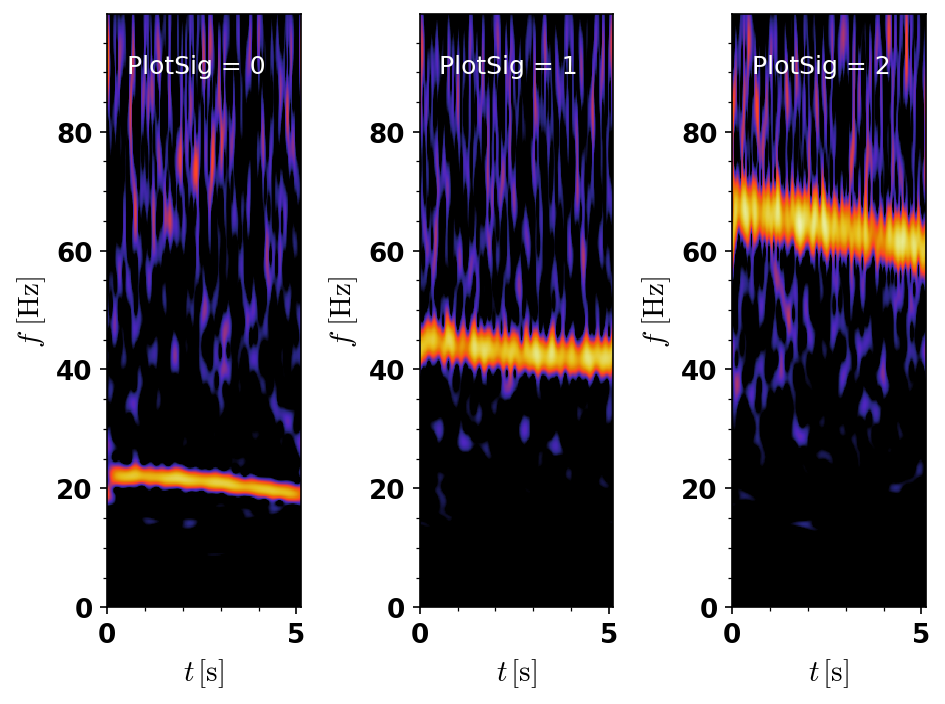

In [ ]:
fig, axvec = plt.subplots(dpi=b.PlotDPI, ncols=3, squeeze=True)
for k in range(3):
  b.PlotSig = k
  b.PlotSpectro(fig,axvec[k],vLim=[-1,1])

  axvec[k].text(0.1 * b.tv[-1]/10**b.TScale, 0.9 * b.fv[-1]/10**b.FScale, 'PlotSig = %d' % k,color='white',fontsize=12)

fig.tight_layout()
plt.show()

Finally, we note that

## Tricoherence

Bicoherence analysis is insufficient for analyses involving cubic (or higher-order) coupling. Indeed, the following test signal demonstrates this simply:

Checking inputs...
***NOTE*** :: Resolution set to maximum!
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  6%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 15%|.
 16%|_
 17%|.
 17%\:
 18%-"
 19%/^
 19%|"
 20%|:
 21%|.
 21%|_
 22%|.
 23%\:
 23%-"
 24%/^
 25%|"
 25%|:
 26%|.
 26%|_
 27%|.
 28%\:
 28%-"
 29%/^
 30%|"
 30%|:
 31%|.
 32%|_
 32%|.
 33%\:
 34%-"
 34%/^
 35%|"
 35%|:
 36%|.
 37%|_
 37%|.
 38%\:
 39%-"
 39%/^
 40%|"


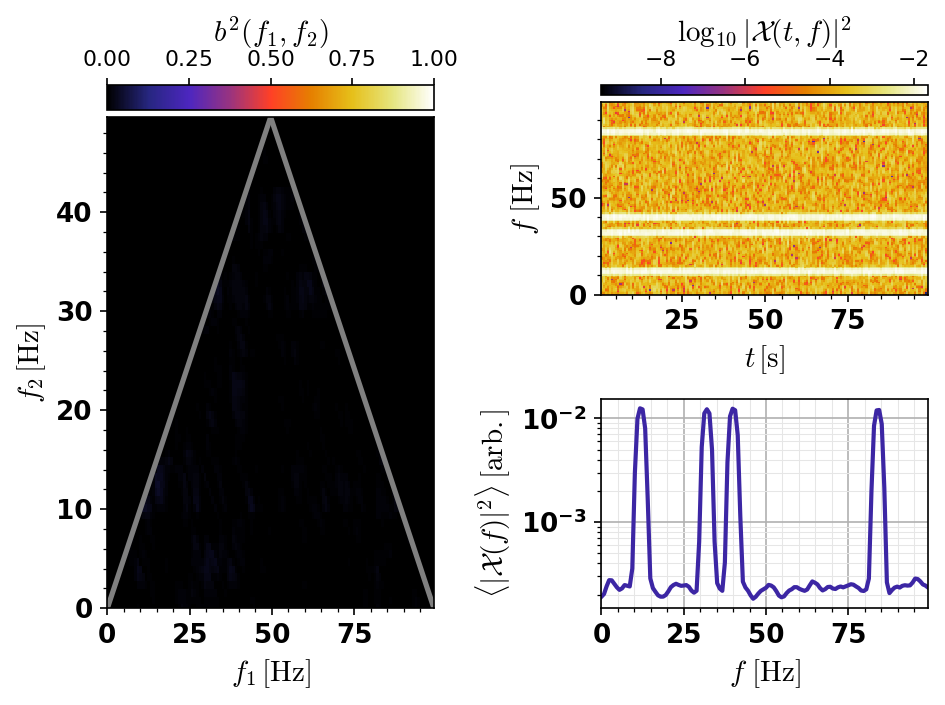

In [ ]:
bic.BicAn.NormBic = True
x, t, fS = bic.TestSignal('4tone')
b = bic.BicAn(x,samprate=fS,spectype='stft',trispec=True,subint=256)

Max t^2 = 0.9257089354683259
@ (fx,fy,fz) =  39.84375 32.03125 11.71875


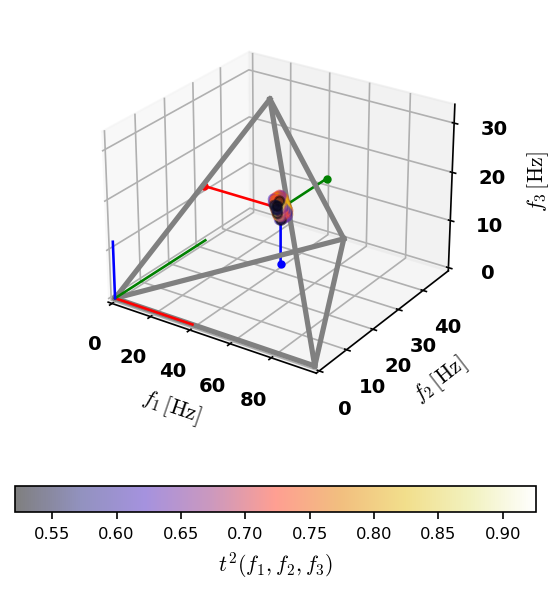

[51, 41, 15]

In [ ]:
b.PlotTrispec()

Max t^2 = 0.9289279858815652
@ (fx,fy,fz) =  40.625 32.03125 11.71875


/content/pybic.py:1185: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


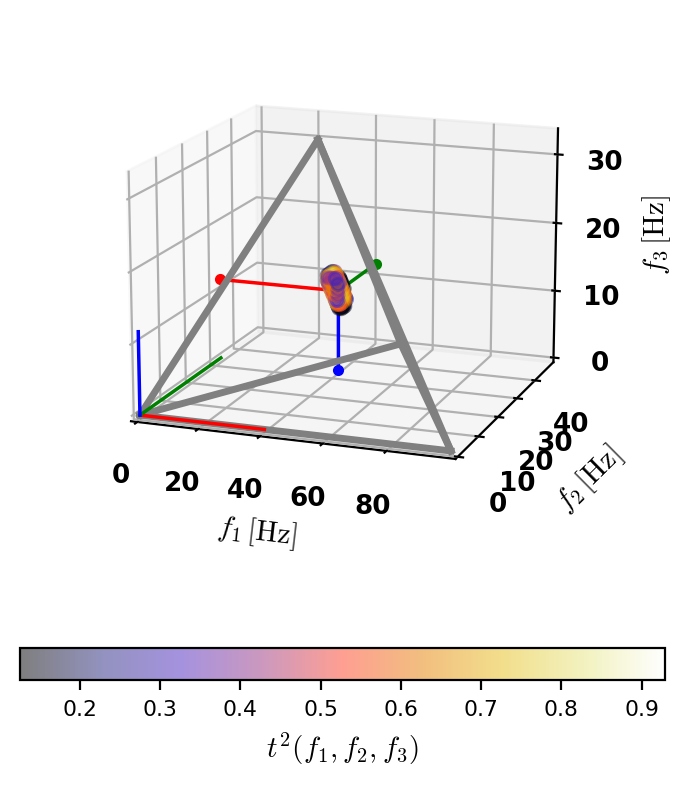

[52, 41, 15]

In [ ]:
b.PlotDPI = 200
b.PlotTrispec(0.1,azim=-70,elev=15,shrink=0.65)

Checking inputs...
***NOTE*** :: Resolution set to maximum!
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  6%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 15%|.
 16%|_
 17%|.
 17%\:
 18%-"
 19%/^
 19%|"
 20%|:
 21%|.
 21%|_
 22%|.
 23%\:
 23%-"
 24%/^
 25%|"
 25%|:
 26%|.
 26%|_
 27%|.
 28%\:
 28%-"
 29%/^
 30%|"
 30%|:
 31%|.
 32%|_
 32%|.
 33%\:
 34%-"
 34%/^
 35%|"
 35%|:
 36%|.
 37%|_
 37%|.
 38%\:
 39%-"
 39%/^
 40%|"


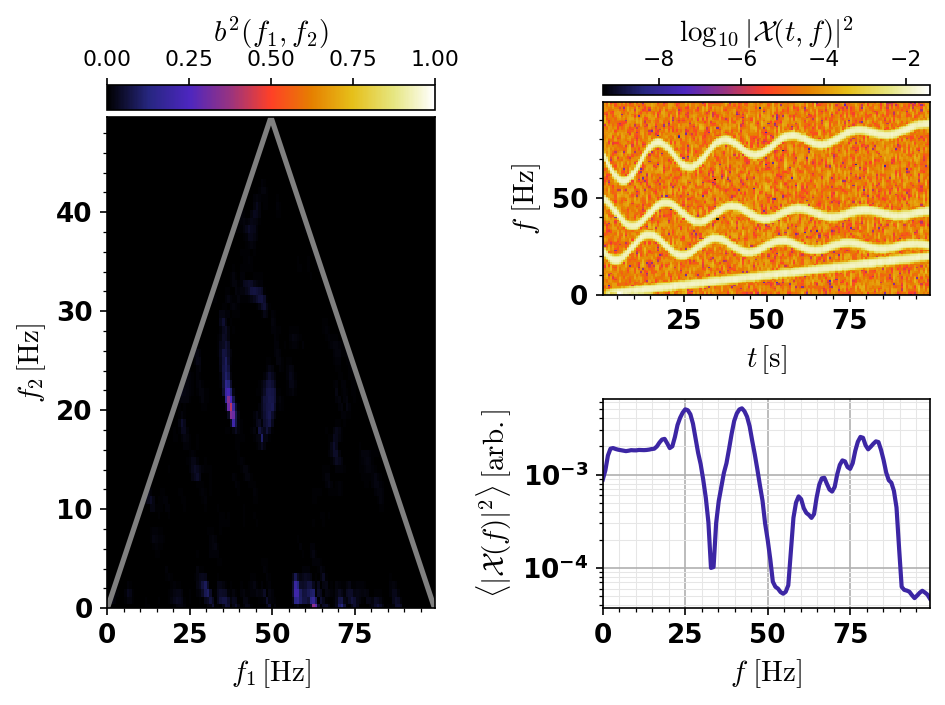

In [ ]:
x, t, fS = bic.TestSignal('helix')
b = bic.BicAn(x,samprate=fS,spectype='stft',trispec=True,subint=256)

Note the lack of significant bispectral features, despite the spectrogram hinting at something more! We estimate the trispectrum and tricoherence spectrum with

In [ ]:
b.Tricoherence()

Calculating tricoherence...      
  2%|_
  3%|.
  5%\:
  6%-"
  8%/^
  9%|"
 11%|:
 12%|.
 14%|_
 16%|.
 17%\:
 19%-"
 20%/^
 22%|"
 23%|:
 25%|.
 27%|_
 28%|.
 30%\:
 31%-"
 33%/^
 34%|"
 36%|:
 38%|.
 39%|_
 41%|.
 42%\:
 44%-"
 45%/^
 47%|"
 48%|:
 50%|.
 52%|_
 53%|.
 55%\:
 56%-"
 58%/^
 59%|"
 61%|:
 62%|.
 64%|_
 66%|.
 67%\:
 69%-"
 70%/^
 72%|"
 73%|:
 75%|.
 77%|_
 78%|.
 80%\:
 81%-"
 83%/^
 84%|"
 86%|:
 88%|.
 89%|_
 91%|.
 92%\:
 94%-"
 95%/^
 97%|"
 98%|:
100%|.
^]



Note the general sluggishness! Visualization is given by

Max t^2 = 0.6667304629467262
@ (fx,fy,fz) =  42.1875 25.0 16.40625


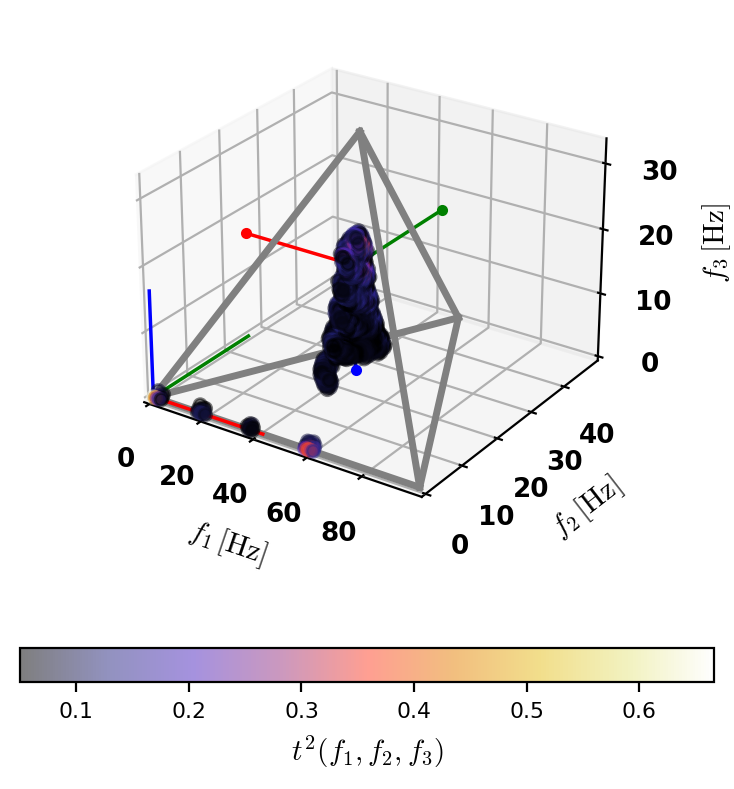

[54, 32, 21]

In [ ]:
b.PlotDPI = 200
b.PlotTrispec(0.05)

## Polyspectra

_BicAn_ supplies the ``GetPolySpec()`` method for assessing phase coherence of arbitrary order. For a simple example, we use the ``cube_couple`` test signal:

In [ ]:
x, t, fS = bic.TestSignal('cube_couple')
b = bic.BicAn(x,samprate=fS,justspec=True)

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  7%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 19%/^
 20%|"
 20%|:
 21%|.
 22%|_
 22%|.
 23%\:
 24%-"
 24%/^
 25%|"
 25%|:
 26%|.
 27%|_
 27%|.
 28%\:
 29%-"
 29%/^
 30%|"
 31%|:
 31%|.
 32%|_
 33%|.
 33%\:
 34%-"
 35%/^
 35%|"
 36%|:
 37%|.
 37%|_
 38%|.
 39%\:
 39%-"
 40%/^
 41%|"
 41%|:
 42%|.
 42%|_


_We have intentionally avoided a calculation of the bicoherence or tricoherence spectrum!_

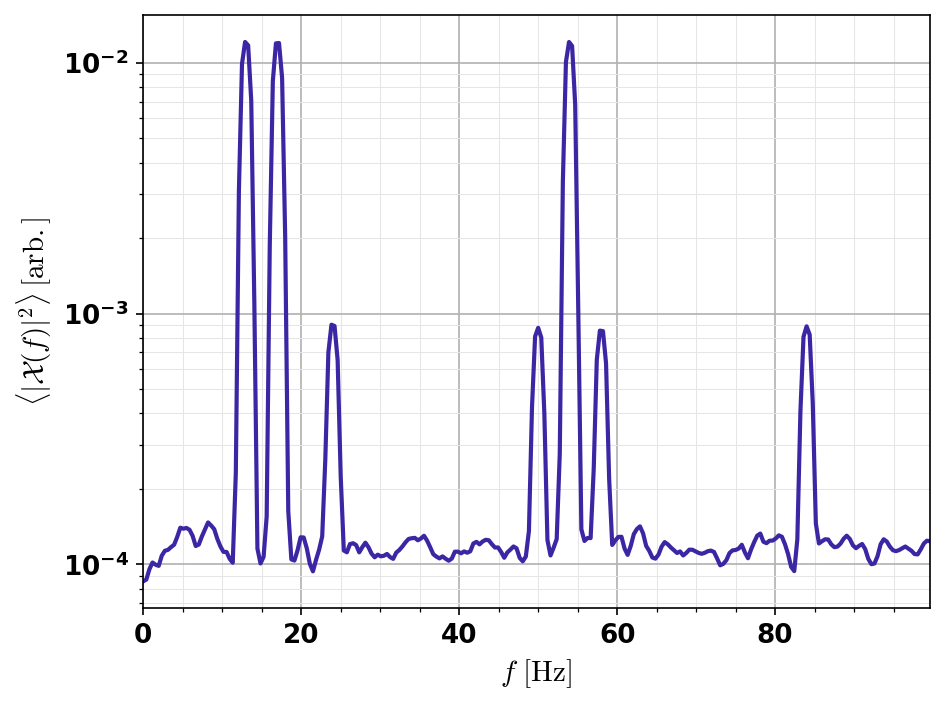

In [ ]:
b.PlotPowerSpec()

As the name suggests, this signal provides a cubic nonlinearity. Indeed, note the three strong peaks at 13, 17, and 54 Hz, and the four subordinate peaks (representing the sinusoids deriving from the cubic term).

That is, given a term such as
$$
\cos(2\pi f_a + \phi_a)\cos(2\pi f_b + \phi_b)\cos(2\pi f_c + \phi_c),
$$
we note the generation of fluctuations at
$$f_A=f_a+f_b+f_c,$$
$$f_B=f_a+f_b-f_c,$$
$$f_C=f_a-f_b+f_c,$$
$$f_D=f_a-f_b-f_c,$$
which (in this example) imply 84, 58, 50, and 24 Hz, respectively.

We could, as before, use the ``Tricoherence()`` method to directly determine the tricoherence spectrum. However, _BicAn_ provides the ``MonteCarloMax()`` method to estimate the global maximum of a given polyspectrum, **without** calculating all possible points (_recall that the $n$th-order polyspectrum is trivially parallelizable!_).

Explicitly, this method randomly chooses a point in poly-frequency space, aquires the $n$th-order coherence with ``GetPolySpec()``, then checks if neighboring points yield a larger value. The process is repeated for a number of "rolls," after which an estimate of the global maximum is returned  (_i.e._, we use a Monte Carlo hillclimb):

Searching neighbors... 1
Searching neighbors... 2
Searching neighbors... 3
Searching neighbors... 4
Searching neighbors... 5
Searching neighbors... 6
Searching neighbors... 7
Searching neighbors... 1
Searching neighbors... 2
Searching neighbors... 3
Searching neighbors... 1
Searching neighbors... 2
Searching neighbors... 3
Searching neighbors... 4
Searching neighbors... 5
Searching neighbors... 6
Searching neighbors... 7


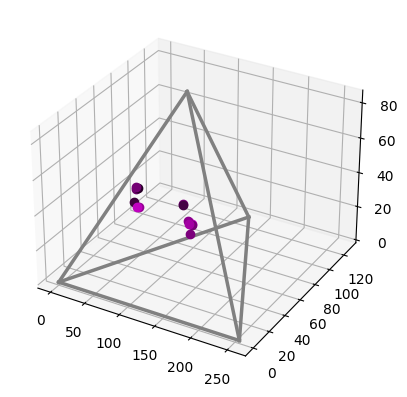

Max found is nCoh = 0.798  @  [53.90625  17.1875   12.890625] Hz 
w/ indices  [138  44  33]
Complete! Process required 2.68529 s.


In [ ]:
maxVal,f = b.MonteCarloMax(3,Nrolls=10000,plot=True)

_Note that the "plot" functionality needs improvement!_

Crucially, ``MonteCarloMax()`` checks only in the _principal domain_ $f_1 > f_2 > \dots > f_n$, where $f_i\geq0$.
<!-- Thus, for an $n$th-order nonlinearity, constructed from fluctuations at  -->

$f_1+f_2+\dots+f_n\leq f_{\rm Nyq}$

For completeness, we compare the above output with the total tricoherence spectrum:

Calculating tricoherence...      
  1%|_
  2%|.
  2%\:
  3%-"
  4%/^
  5%|"
  5%|:
  6%|.
  7%|_
  8%|.
  9%\:
  9%-"
 10%/^
 11%|"
 12%|:
 12%|.
 13%|_
 14%|.
 15%\:
 16%-"
 16%/^
 17%|"
 18%|:
 19%|.
 20%|_
 20%|.
 21%\:
 22%-"
 23%/^
 23%|"
 24%|:
 25%|.
 26%|_
 27%|.
 27%\:
 28%-"
 29%/^
 30%|"
 30%|:
 31%|.
 32%|_
 33%|.
 34%\:
 34%-"
 35%/^
 36%|"
 37%|:
 38%|.
 38%|_
 39%|.
 40%\:
 41%-"
 41%/^
 42%|"
 43%|:
 44%|.
 45%|_
 45%|.
 46%\:
 47%-"
 48%/^
 48%|"
 49%|:
 50%|.
 51%|_
 52%|.
 52%\:
 53%-"
 54%/^


/content/pybic.py:1185: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


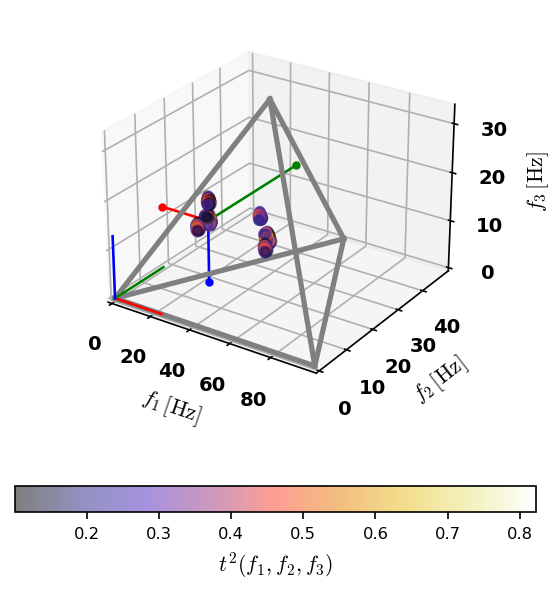

[62, 43, 33]

In [ ]:
b.Tricoherence()
b.PlotTrispec(0.1)

We notice that this command required nearly 40 seconds to complete, while ``MonteCarloMax`` required approximately 2.

Now, with the location of the maximum in hand, we use ``CheckCouple()`` to assess the phase-coherence of points which would appear in a $n$th-order nonlinearity. This is straightforward because, regardless of the order of a nonlinearity, **only two peaks can exist within the principal domain!**

Consider the present example. Note that, despite the four "daughter waves," at
$$f_A=f_a+f_b+f_c,$$
$$f_B=f_a+f_b-f_c,$$
$$f_C=f_a-f_b+f_c,$$
$$f_D=f_a-f_b-f_c,$$
only evidence of $f_A$ and $f_D$ will appear in the principal domain. Explicitly, tricoherence will be observed only at
$(f_a,f_b,f_c)$ _or_
$(f_a-f_b-f_c,f_b,f_c)$, since the remaining peaks in the complete $n$th-order coherence spectrum require at least one _subtraction_. (Indeed, a simpler way to cement this fact is to observe that the principal domain allows only addition!)

Hence, if a peak is found in the principal domain, it must either be due to a "pure sum" (_e.g._, like $f_a+f_b+f_c$), or a "pure difference" (_e.g._, like $f_a-f_b-f_c$). In our case, the peak value of tricoherence, found at $(f_1,f_2,f_3) \approx (24,17,13)$ Hz, is the latter. ``CheckCouple()`` also demonstrates this:

In [ ]:
b.CheckCouple(f)

[ 62 -43 -33] ~> 0.0023594182064361124
[ 62 -43  33] ~> 0.00037165941739513407
[ 62  43 -33] ~> 0.004081856607809628
[62 43 33] ~> 0.8221844580471741
Mean is  0.20724934806970374


array([2.35941821e-03, 3.71659417e-04, 4.08185661e-03, 8.22184458e-01])

In effect, this method uses ``GetPolySpec()`` to return the tricoherence associated with (24,-17,-13), (24,-17,13), (24,17,-13), and (24,17,13) Hz. Notice that only the final value exceeds 0.005; however, if we use the coordinates (24+17+13,17,13) Hz, ``CheckCouple()`` returns:

In [ ]:
g = 1*f
g[0] = sum(f)
b.CheckCouple(g)

[138 -43 -33] ~> 0.8175646836411327
[138 -43  33] ~> 0.8320237619242762
[138  43 -33] ~> 0.81283295493384
[138  43  33] ~> 0.7917106589194003
Mean is  0.8135330148546622


array([0.81756468, 0.83202376, 0.81283295, 0.79171066])

As expected, these results _are_ consistent with cubic coupling!

## Filtering

There are a number of situations where the application of a digital filter is advantageous.

In the following example, we use a Butterworth bandpass filter to separate the ``'3tone'`` data into distinct channels. _Note that the bandwidth is also varied!_

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  1%|_
  1%|.
  2%\:
  3%-"
  3%/^
  4%|"
  5%|:
  5%|.
  6%|_
  7%|.
  7%\:
  8%-"
  8%/^
  9%|"
 10%|:
 10%|.
 11%|_
 12%|.
 12%\:
 13%-"
 14%/^
 14%|"
 15%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 19%/^
 20%|"
 20%|:
 21%|.
 22%|_
 22%|.
 23%\:
 24%-"
 24%/^
 25%|"
 25%|:
 26%|.
 27%|_
 27%|.
 28%\:
 29%-"
 29%/^
 30%|"
 31%|:
 31%|.
 32%|_
 33%|.
 33%\:
 34%-"
 35%/^
 35%|"
 36%|:
 37%|.
 37%|_
 38%|.
 39%\:
 39%-"
 40%/^
 41%|"
 41%|:
 42%|.
 42%|_


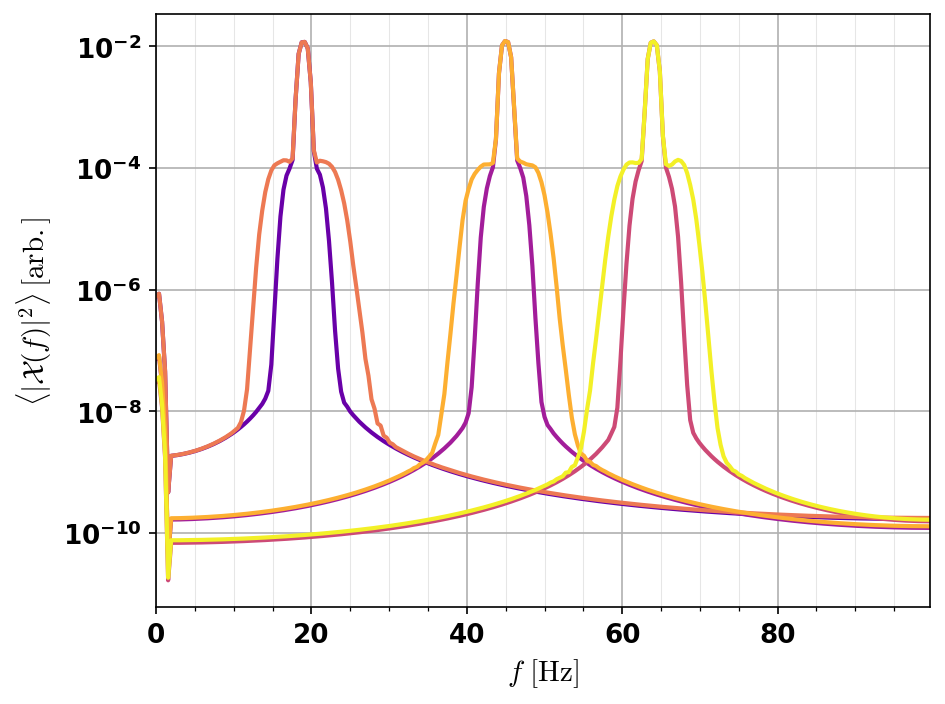

In [ ]:
x, t, fS = bic.TestSignal('3tone')
X = np.zeros((x.shape[0],6))
cnt = 0
for fband in [2.5,5]:
  for flim in [19,45,64]:
    X[:,cnt] = bic.ApplyRealBandpass(x,fS,flim,fband)
    cnt += 1
b = bic.BicAn(X,samprate=fS,justspec=True,cmap='plasma')

b.PlotPowerSpec()

Applying the CWT leads to

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying CWT...      
  0%|_
  0%|.
  1%\:
  1%-"
  1%/^
  1%|"
  1%|:
  2%|.
  2%|_
  2%|.
  2%\:
  2%-"
  3%/^
  3%|"
  3%|:
  3%|.
  3%|_
  4%|.
  4%\:
  4%-"
  4%/^
  4%|"
  4%|:
  5%|.
  5%|_
  5%|.
  5%\:
  5%-"
  6%/^
  6%|"
  6%|:
  6%|.
  6%|_
  7%|.
  7%\:
  7%-"
  7%/^
  7%|"
  8%|:
  8%|.
  8%|_
  8%|.
  8%\:
  9%-"
  9%/^
  9%|"
  9%|:
  9%|.
 10%|_
 10%|.
 10%\:
 10%-"
 10%/^
 11%|"
 11%|:
 11%|.
 11%|_
 11%|.
 12%\:
 12%-"
 12%/^
 12%|"
 12%|:
 12%|.
 13%|_


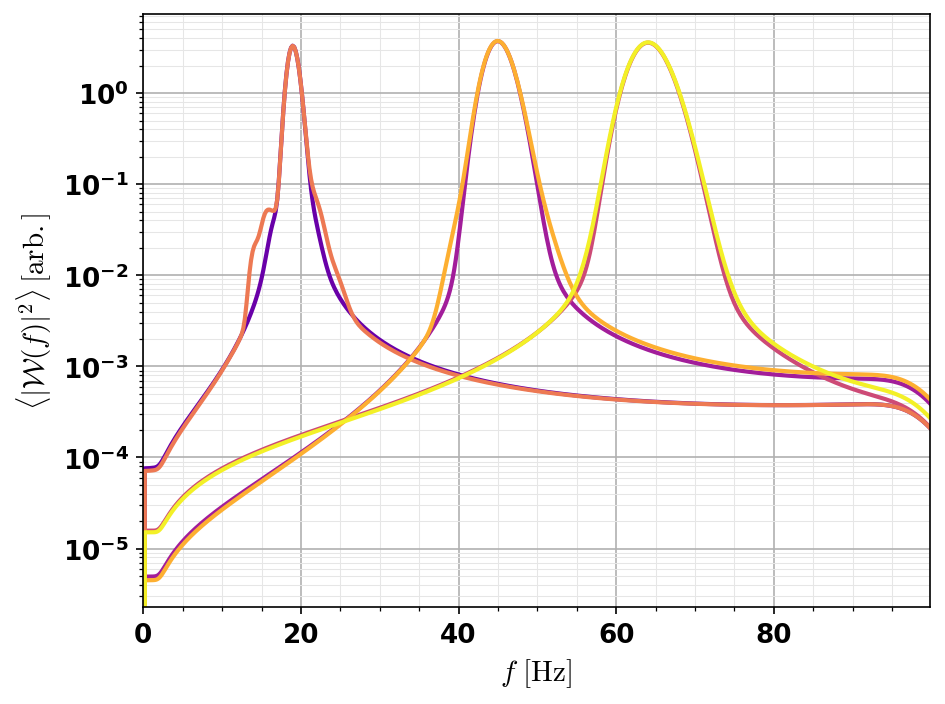

In [ ]:
b = bic.BicAn(X[0:1024,:],samprate=fS,justspec=True,cmap='plasma',spectype='cwt')
b.PlotPowerSpec()

Note that _BicAn_ can accept an arbitrary number of channels! Thus, it can be leveraged to calculate large volumes of STFT or CWT in a controlled, user-friendly way.

## Instantaneous frequency

In addition to the previous "bells and whistles," _BicAn_ enables users to assess the _instantaneous_ frequency of a given time-series.

The most direct way to determine such information is to identify zero-crossings in the data, from which the instantaneous frequency is simply the inverse of the time between every other zero crossing.

Unfortunately, the efficacy of such a straightforward technique begins to break down when the instantaneous frequency exceeds roughly 10% of the sampling rate; the following example demonstrates this clearly (using the ``InstFreqZeroCross()`` method):

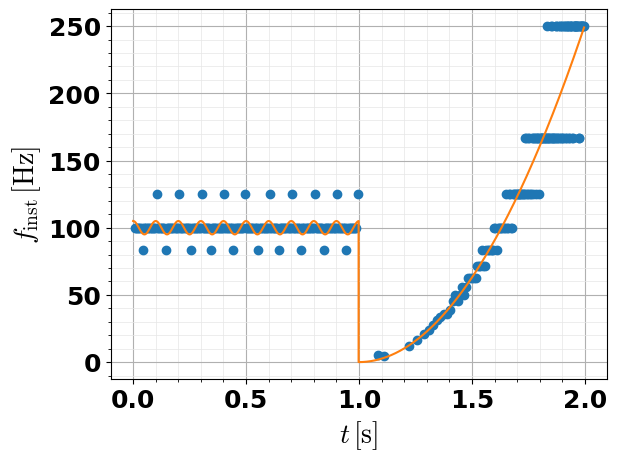

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

N = 1000
#t = np.linspace(0,1,N)
fS = 500.0
t = np.arange(0,1,1/fS)
Ffin = fS/2
y = np.sin(2*np.pi * Ffin * t**3 / 3 )

fx = 100
Ff = 10
Afx = 5
dfx = Afx*np.sin(2*np.pi*t*Ff) / (2*np.pi*Ff)

y_int = fx + Afx*np.cos(2*np.pi*t*Ff)
y_int = np.concatenate((y_int,Ffin * t**2))

y = np.concatenate((np.sin(2*np.pi*(fx*t + dfx)), y))
t = np.concatenate((t, t+t[-1]))

# y, t, fS = bic.TestSignal('inst_freq_test')

Dt = t[1] - t[0]

T,freq = bic.InstFreqZeroCross(y,dt=Dt)
plt.plot(T,freq,'o')
plt.plot(t,y_int)
bic.PlotLabels(plt.gcf(),plt.gca(),[r'$t\,{\rm [s]}$',r'$f_{\rm inst}\,{\rm [Hz]}$'])
plt.show()

In this plot, the blue points represent the measured $f_{\rm inst}$, while the orange trace shows the analytic result.

Explicitly, we have discretized
$$
x(t) =
\begin{cases}
\sin[2\pi(f_b t + \vartheta)],\qquad &t\in[0,1), \\
\sin[2\pi f_p (t-1)^3/3],\qquad &t\in[1,2),
\end{cases}
$$
using the modulation $\vartheta = f_A\sin(2\pi f_m t)/2\pi f_m$,
where $f_b=100$ Hz and $f_m=10$ Hz are the base and modulation frequencies, respectively (the FM amplitude is $f_A = 5$ Hz).

In other words, this signal contains both a frequency modulation and a (quadratic) frequency sweep, with peak frequency $f_p = 250$ Hz.

Note the clear discretization in $f_{\rm inst}$ (especially conspicuous before $t=1$ s and after $t=1.5$ s)!
To mitigate such issues, we use [Whittaker-Shannon interpolation](https://en.wikipedia.org/wiki/Whittaker%E2%80%93Shannon_interpolation_formula) $-$ controlled by the ``Ninterp`` flag $-$ to upsample the time-series:

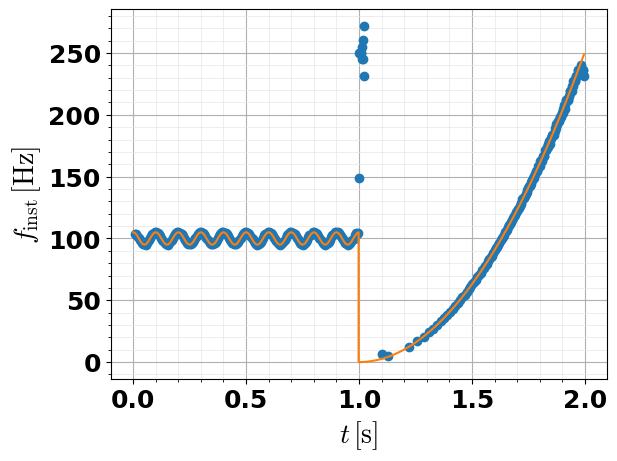

In [ ]:
T,freq = bic.InstFreqZeroCross(y,dt=Dt,Ninterp=25000)
plt.plot(T,freq,'o')
plt.plot(t,y_int)
bic.PlotLabels(plt.gcf(),plt.gca(),[r'$t\,{\rm [s]}$',r'$f_{\rm inst}\,{\rm [Hz]}$'])
plt.show()

Note that the accuracy of the inferred $f_{\rm inst}$ has been enhanced substantially!

Furthermore, ``PlotSpectro()`` supplies a ``maxLine`` parameter to calculate the instantaneous frequency from the CWT's peak value:

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying CWT...      
  0%|_
  0%|.
  1%\:
  1%-"
  1%/^
  1%|"
  1%|:
  2%|.
  2%|_
  2%|.
  2%\:
  2%-"
  3%/^
  3%|"
  3%|:
  3%|.
  3%|_
  4%|.
  4%\:
  4%-"
  4%/^
  4%|"
  5%|:
  5%|.
  5%|_
  5%|.
  5%\:
  6%-"
  6%/^
  6%|"
  6%|:
  6%|.
  7%|_
  7%|.
  7%\:
  7%-"
  7%/^
  8%|"
  8%|:
  8%|.
  8%|_
  8%|.
  9%\:
  9%-"
  9%/^
  9%|"
  9%|:
 10%|.
 10%|_
 10%|.
 10%\:
 10%-"
 11%/^
 11%|"
 11%|:
 11%|.
 11%|_
 12%|.
 12%\:
 12%-"
 12%/^
 12%|"
 13%|:
 13%|.
 13%|_


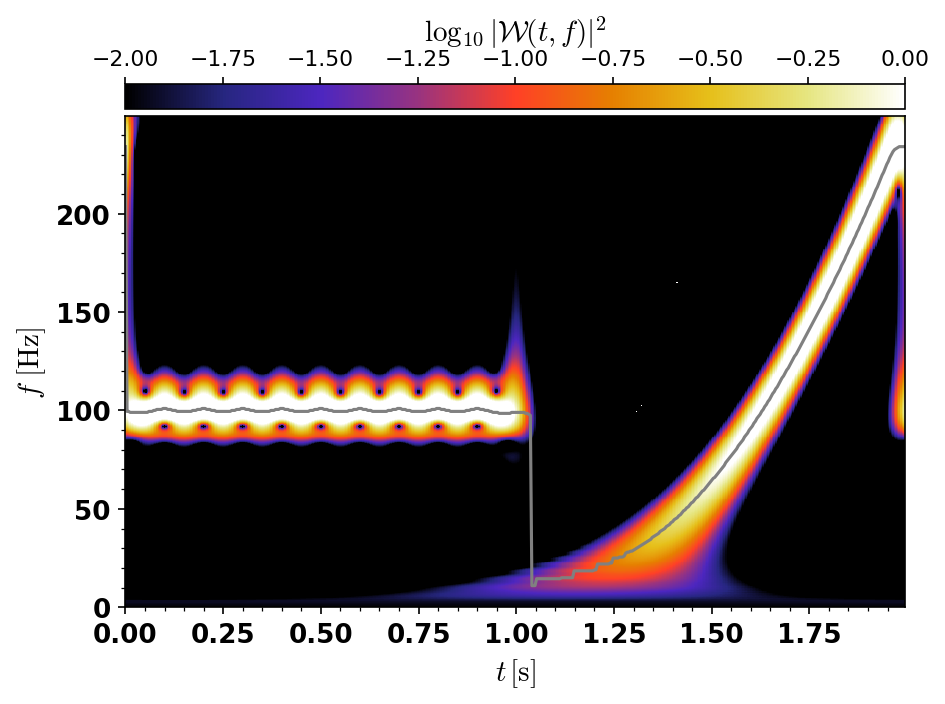

In [ ]:
b = bic.BicAn(y,samprate=fS,spectype='cwt',justspec=True)
b.PlotSpectro(vLim=[-2,0],maxLine=1)

This is an excellent (and computationally cheap!) method to estimate $f_{\rm inst}$, but we see that it underestimates the FM amplitude as compared to the zero-crossing technique:

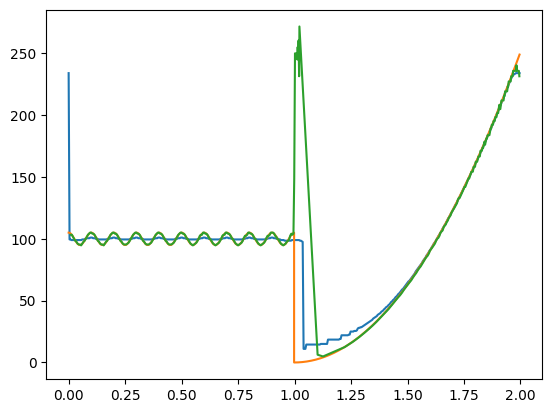

In [ ]:
plt.plot(b.tv,b.InstFreq)
plt.plot(t,y_int)
plt.plot(T,freq)

We note that the ``PlotRHS()`` method can be used to add an explicit label on the right-hand side:
<!-- To compare amplitude and frequency modulation, we plot the instantaneous frequency over the raw signal: -->

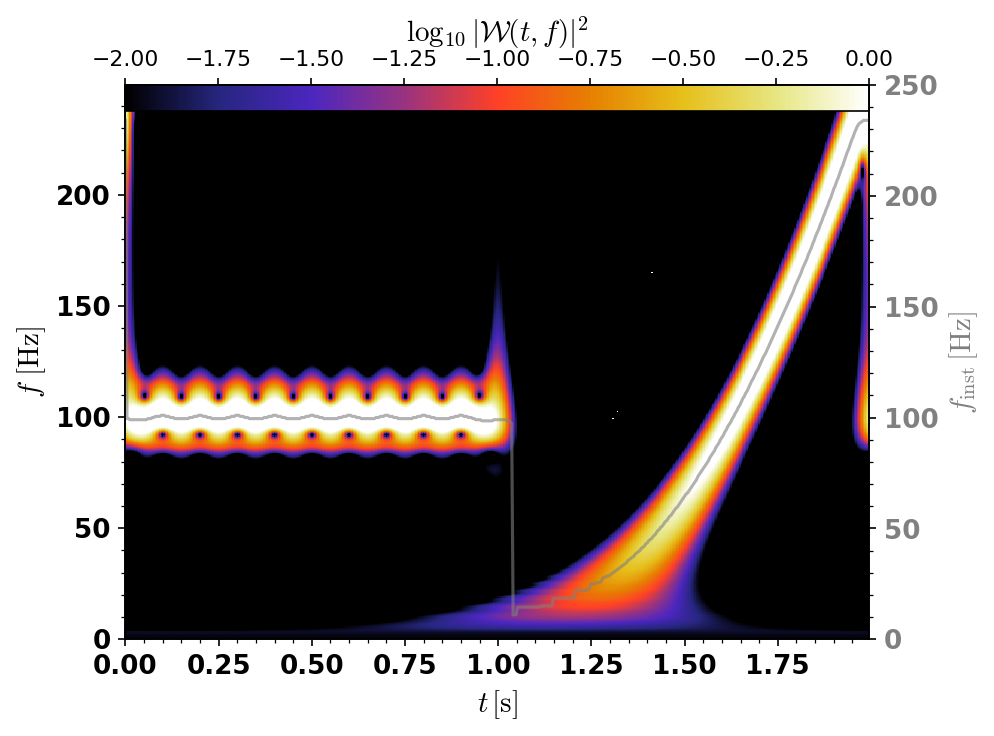

In [ ]:
fig,ax = plt.subplots(dpi=b.PlotDPI)

b.PlotSpectro(fig,ax,vLim=[-2,0])
bic.PlotRHS(b.tv / 10**b.TScale, b.InstFreq / 10**b.FScale, ax, r_col='gray', lw=1.5, alph=0.6,ylab=r'$f_{\mathrm{inst}}\,\mathrm{[Hz]}$',fsize=b.FontSize,ylim=[0,250])
# bic.PlotRHS(T, freq, ax, r_col='C0', lw=1.5, alph=0.6,ylab=r'$f_{\mathrm{inst}}\,\mathrm{[Hz]}$',fsize=b.FontSize,ylim=[0,250])

plt.show()

Now, for something interesting, we take the calculated $f_{\rm inst}$ vs. $t$ and treat it like another time-series (sampled at $f_s/2$). Performing a CWT on these data yields a scaleogram of the modulation frequency!

Checking inputs...
***NOTE*** :: Resolution set to maximum!
***NOTE*** :: Resolution set to maximum!
***WARNING*** :: Subinterval too large for time-series... Using 500.
done.
Applying CWT...      
  1%|_
  2%|.
  2%\:
  3%-"
  4%/^
  5%|"
  6%|:
  6%|.
  7%|_
  8%|.
  9%\:
 10%-"
 10%/^
 11%|"
 12%|:
 13%|.
 14%|_
 14%|.
 15%\:
 16%-"
 17%/^
 18%|"
 18%|:
 19%|.
 20%|_
 21%|.
 22%\:
 22%-"
 23%/^
 24%|"
 25%|:
 26%|.
 26%|_
 27%|.
 28%\:
 29%-"
 30%/^
 30%|"
 31%|:
 32%|.
 33%|_
 34%|.
 34%\:
 35%-"
 36%/^
 37%|"
 38%|:
 38%|.
 39%|_
 40%|.
 41%\:
 42%-"
 42%/^
 43%|"
 44%|:
 45%|.
 46%|_


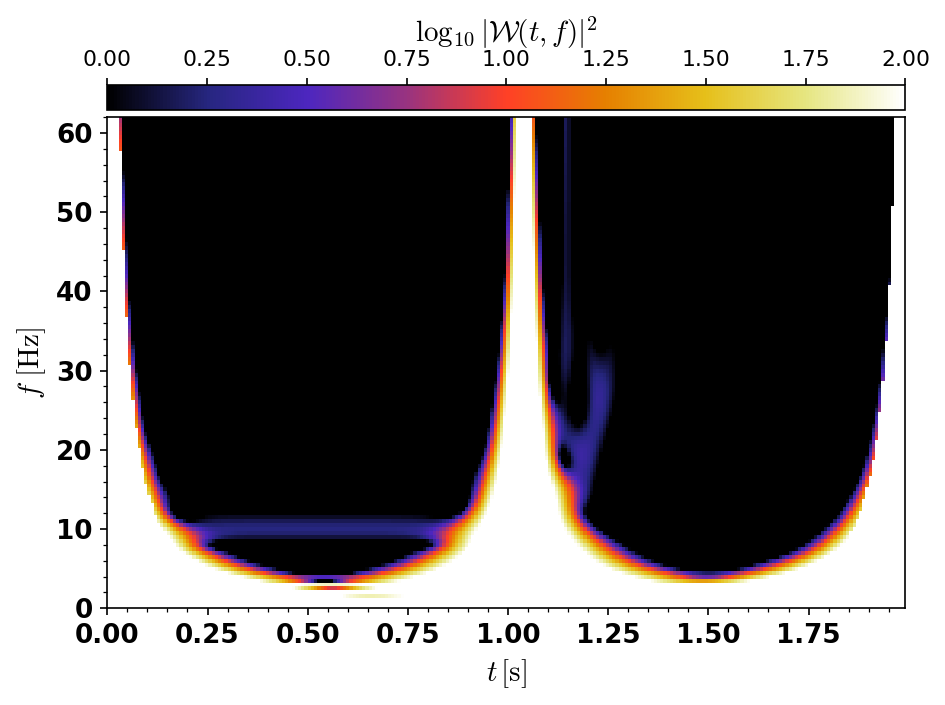

In [ ]:
bc = bic.BicAn(b.InstFreq,samprate=fS/2,limfreq=4.0,
               spectype='cwt',justspec=True,
               sigma=np.pi/4,calccoi=True)

bc.PlotSpectro(vLim=[0,2])

We see a (faint!) indication of a 10 Hz modulation, which is precisely what was programmed!

### Time-resolved bispectrum

As we have seen, ignoring time-dependencies in the bispectrum may occlude a complete picture of the underlying dynamics.
<!-- Indeed, the above figure makes it clear that the bispectrum at $(f_1,f_2)\approx (46,16)$ Hz is not phase-coherent _most_ of the time! -->

A reasonable question is then, _can we quantify phase-stationarity in time-dependent systems?_ The answer, of course, is _yes!_
Consider the function $x(t) = A(t) e^{i\phi(t)}$, where $A(t)$ and $\phi(t)$ are the instantaneous amplitude and phase, respectively. Then, the "instantaneous angular frequency" is simply the time derivative of phase $\dot{\phi}(t)$.

Hence, the derivative of the biphase represents the "instantaneous difference frequency" $\Delta f_{\rm inst}(t) \equiv \dot{\beta}(t)/2\pi  = f_1(t) + f_2(t) - f_3(t)$.

To apply this idea, we return to the ``'d3dtest'`` signal:

In [ ]:
x, t, fS = bic.TestSignal('d3dtest')
b = bic.BicAn(x[0:10000],samprate=fS,plotit=False,spectype='stft')
Ir,Ic,maxVal = b.FindMaxInRange(60,100,10,40)

Checking inputs...
***NOTE*** :: Resolution set to maximum!
done.
Applying STFT...      
  1%|_
  3%|.
  4%\:
  5%-"
  7%/^
  8%|"
  9%|:
 11%|.
 12%|_
 13%|.
 15%\:
 16%-"
 17%/^
 19%|"
 20%|:
 21%|.
 23%|_
 24%|.
 25%\:
 27%-"
 28%/^
 29%|"
 31%|:
 32%|.
 33%|_
 35%|.
 36%\:
 37%-"
 39%/^
 40%|"
 41%|:
 43%|.
 44%|_
 45%|.
 47%\:
 48%-"
 49%/^
 51%|"
 52%|:
 53%|.
 55%|_
 56%|.
 57%\:
 59%-"
 60%/^
 61%|"
 63%|:
 64%|.
 65%|_
 67%|.
 68%\:
 69%-"
 71%/^
 72%|"
 73%|:
 75%|.
 76%|_
 77%|.
 79%\:
 80%-"
 81%/^
 83%|"
 84%|:
 85%|.
 87%|_


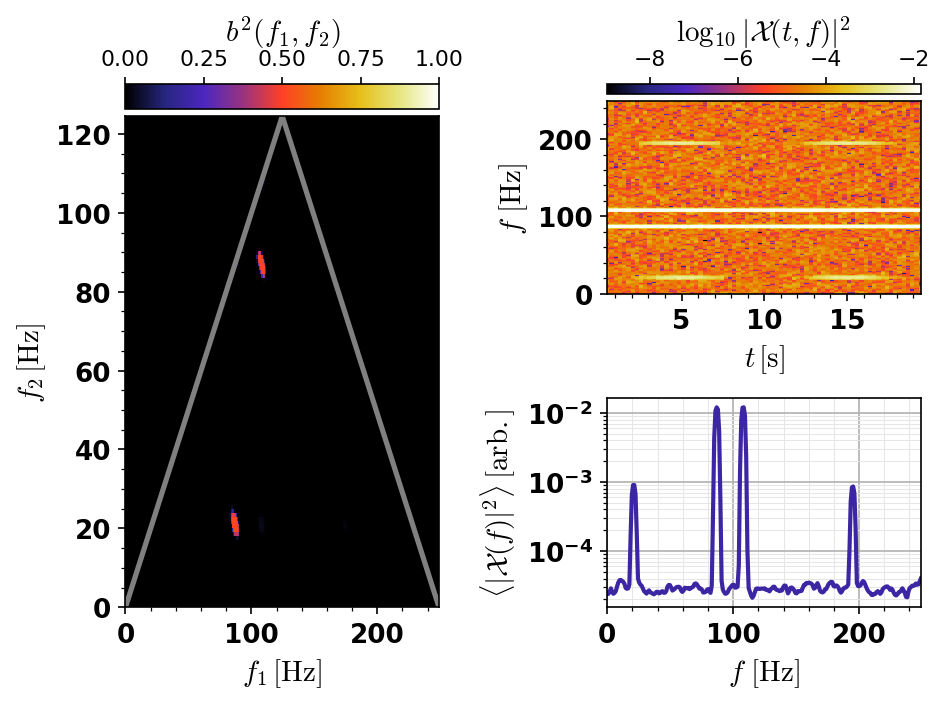

In [ ]:
b.PlotGUI()

Note that we have truncated the time-series to make the individual "pulses" more conspicuous. Consolidating our line-outs gives

Calculating distribution for $(20.51,86.91)\,\mathrm{Hz}$...      
  0%|_
  1%|.
  2%\:
  2%-"
  2%/^
  3%|"
  4%|:
  4%|.
  4%|_
  5%|.
  6%\:
  6%-"
  6%/^
  7%|"
  8%|:
  8%|.
  8%|_
  9%|.
 10%\:
 10%-"
 10%/^
 11%|"
 12%|:
 12%|.
 12%|_
 13%|.
 14%\:
 14%-"
 14%/^
 15%|"
 16%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 18%/^
 19%|"
 20%|:
 20%|.
 20%|_
 21%|.
 22%\:
 22%-"
 22%/^
 23%|"
 24%|:
 24%|.
 24%|_
 25%|.
 26%\:
 26%-"
 26%/^
 27%|"
 28%|:
 28%|.
 28%|_
 29%|.
 30%\:
 30%-"
 30%/^
 31%|"
 32%|:
 32%|.
 32%|_
 33%|.
 3

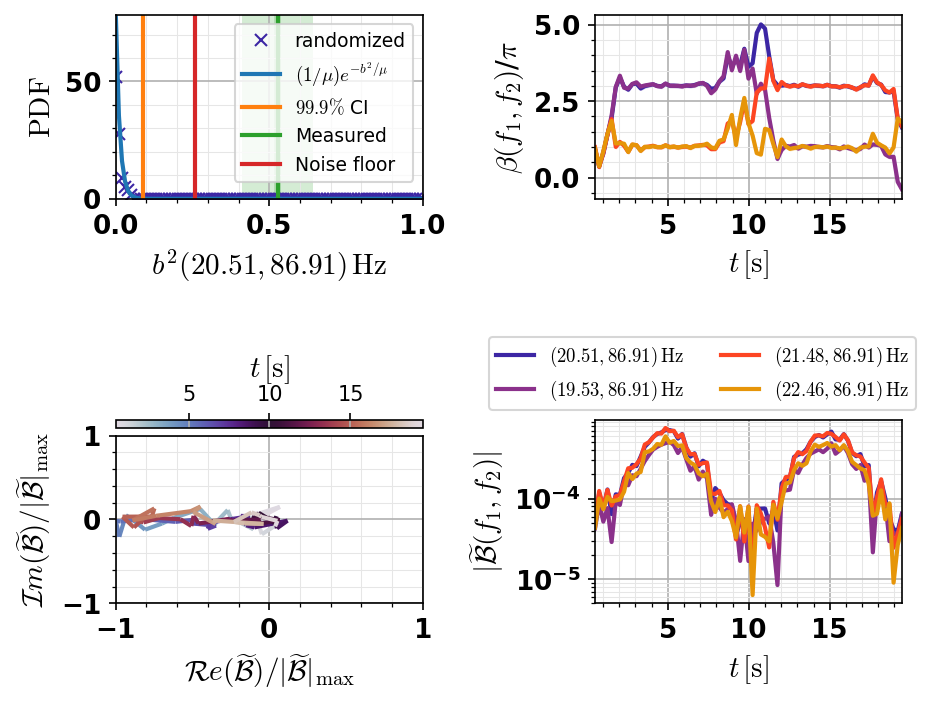

([21], [89])

In [ ]:
b.PlotPointOut(X=[Ir],Y=[Ic],PlotAll=True,CheckNeighbors=True)


This may be visualized by toggling SHIFT + ``f`` and clicking, or using

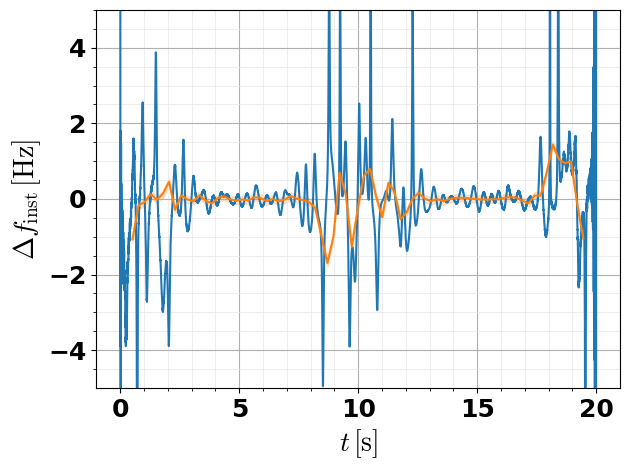

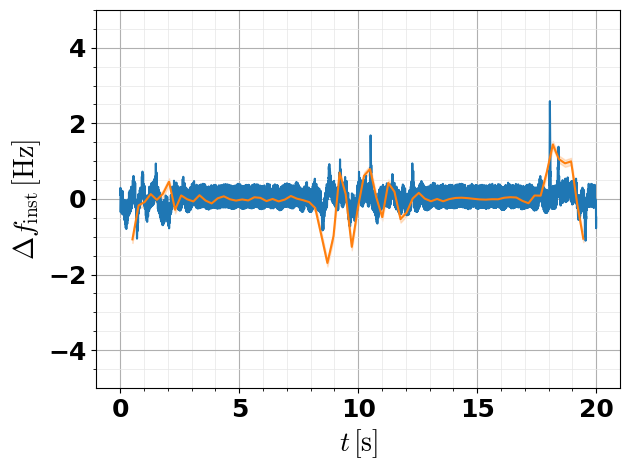

array([[ 20.08012048,  20.08012048,  20.08012048, ...,  20.833125  ,
         20.833125  ,  20.833125  ],
       [ 89.28482143,  89.28482143,  89.28482143, ...,  78.12421875,
         78.12421875,  78.12421875],
       [108.69456522, 108.69456522, 108.69456522, ..., 103.14884095,
        102.03979592, 102.03979592]])

In [ ]:
b.PlotInstFreq(Ir,Ic,freq_type='hilbert')
b.PlotInstFreq(Ir,Ic,freq_type='zerocross')

Plotting the normalized local bispectral modulus vs. $\Delta f_{\rm inst}$ then quantifies how correlated instances of enhanced bispectral magnitude are to periods of stationary biphase.

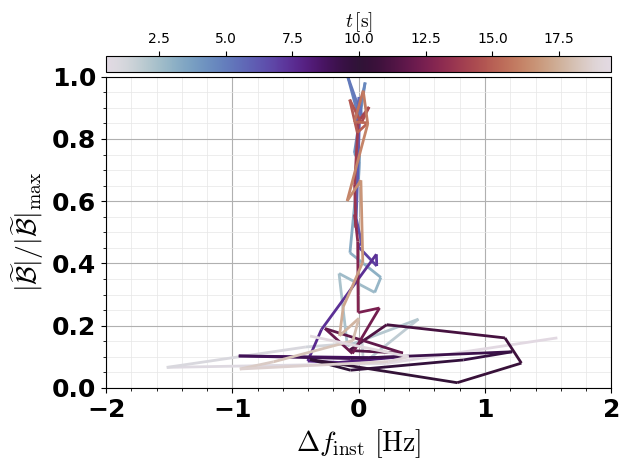

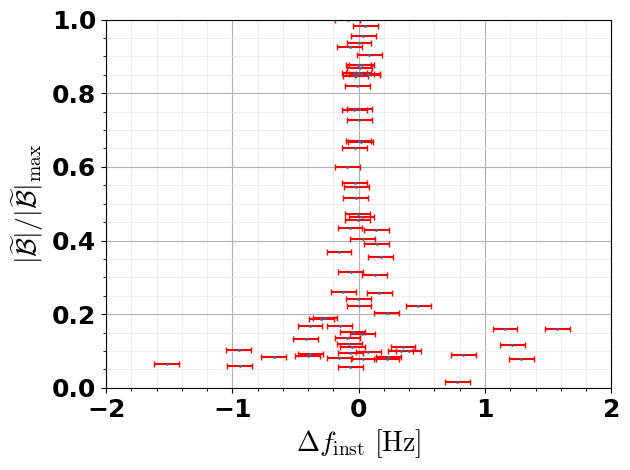

In [ ]:
_,_,_,_ = b.InstDiffFreq(Ir,Ic,fband=2.0,plot=True,err=False)
_,_,_,_ = b.InstDiffFreq(Ir,Ic,fband=2.0,plot=True,err=True)

Note how the instantaneous difference frequency appears to "lock" to zero precisely when the local bispectral modulus is enhanced!

Now, using the CWT to zoom in on a single pulse, we see

Checking inputs...
***NOTE*** :: Resolution set to maximum!
***WARNING*** :: Subinterval too small for requested resolution... Using required.
done.
Applying CWT...      
  0%|_
  0%|.
  0%\:
  0%-"
  0%/^
  0%|"
  0%|:
  0%|.
  0%|_
  0%|.
  0%\:
  0%-"
  1%/^
  1%|"
  1%|:
  1%|.
  1%|_
  1%|.
  1%\:
  1%-"
  1%/^
  1%|"
  1%|:
  1%|.
  1%|_
  1%|.
  1%\:
  1%-"
  1%/^
  1%|"
  1%|:
  1%|.
  1%|_
  1%|.
  1%\:
  1%-"
  1%/^
  2%|"
  2%|:
  2%|.
  2%|_
  2%|.
  2%\:
  2%-"
  2%/^
  2%|"
  2%|:
  2%|.
  2%|_
  2%|.
  2%\:
  2%-"
  2%/^
  2%|"
  2%|:
  2%|.
  2%|_
  2%|.
  2%\:


/content/pybic.py:981: RuntimeWarning: divide by zero encountered in log10
  im = ax.pcolormesh(t,f,2*np.log10(abs(self.sg[:,:,self.PlotSig]) + 0*1e-16), cmap=self.CMap, shading='auto', vmin=vLim[0], vmax=vLim[1])


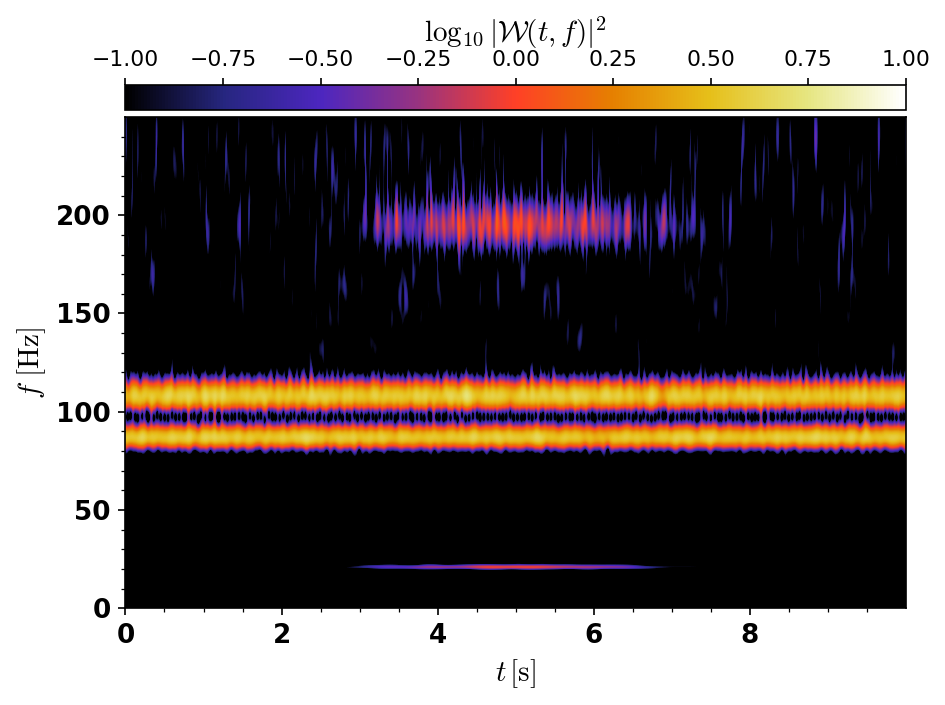

In [ ]:
b = bic.BicAn(x[0:5000],samprate=fS,justspec=True,spectype='cwt',sizewarn=False)
# Ir,Ic,maxVal = b.FindMaxInRange(60,100,10,40)
b.PlotSpectro(vLim=[-1,1])

Calculating distribution for $(86.00,21.00)\,\mathrm{Hz}$...      
  0%|_
  1%|.
  2%\:
  2%-"
  2%/^
  3%|"
  4%|:
  4%|.
  4%|_
  5%|.
  6%\:
  6%-"
  6%/^
  7%|"
  8%|:
  8%|.
  8%|_
  9%|.
 10%\:
 10%-"
 10%/^
 11%|"
 12%|:
 12%|.
 12%|_
 13%|.
 14%\:
 14%-"
 14%/^
 15%|"
 16%|:
 16%|.
 16%|_
 17%|.
 18%\:
 18%-"
 18%/^
 19%|"
 20%|:
 20%|.
 20%|_
 21%|.
 22%\:
 22%-"
 22%/^
 23%|"
 24%|:
 24%|.
 24%|_
 25%|.
 26%\:
 26%-"
 26%/^
 27%|"
 28%|:
 28%|.
 28%|_
 29%|.
 30%\:
 30%-"
 30%/^
 31%|"
 32%|:
 32%|.
 32%|_
 33%|.
 3

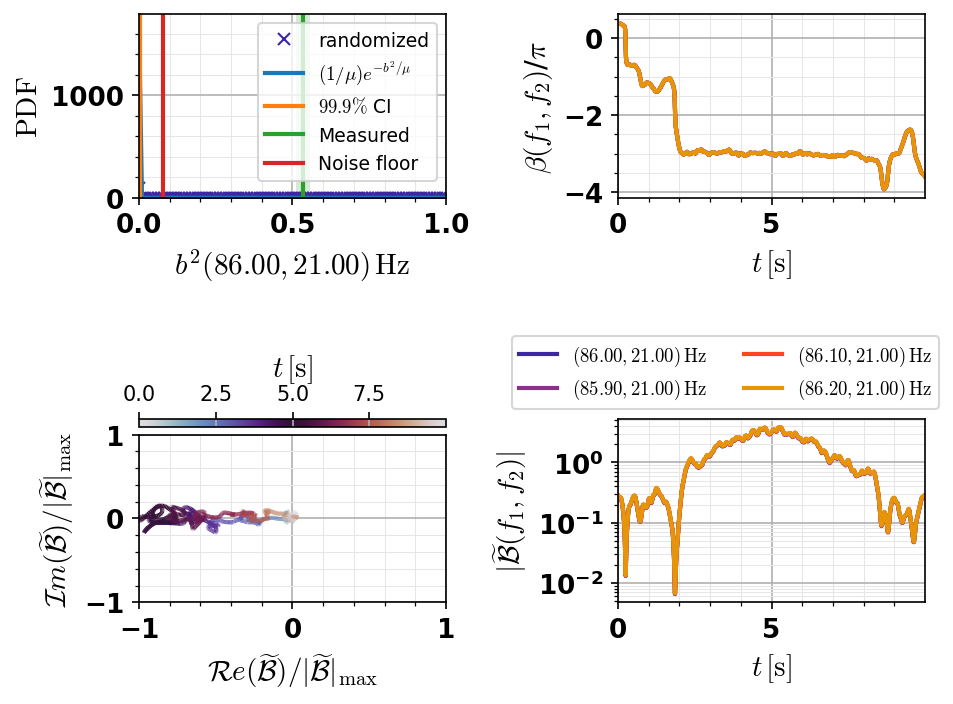

In [ ]:
Ir,Ic = b.PlotPointOut(X=[86],Y=[21],IsFreq=True,PlotAll=True,CheckNeighbors=True)

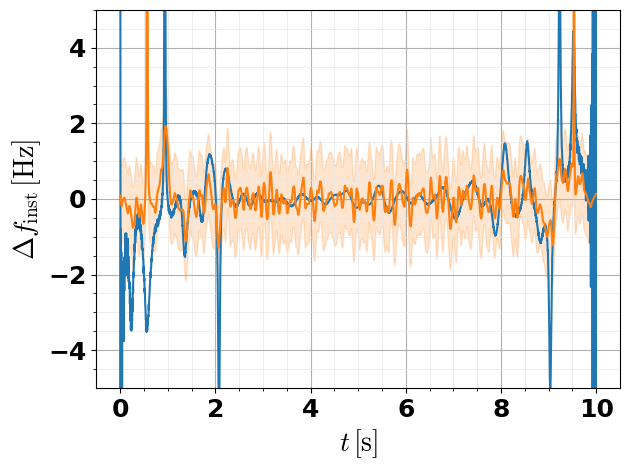

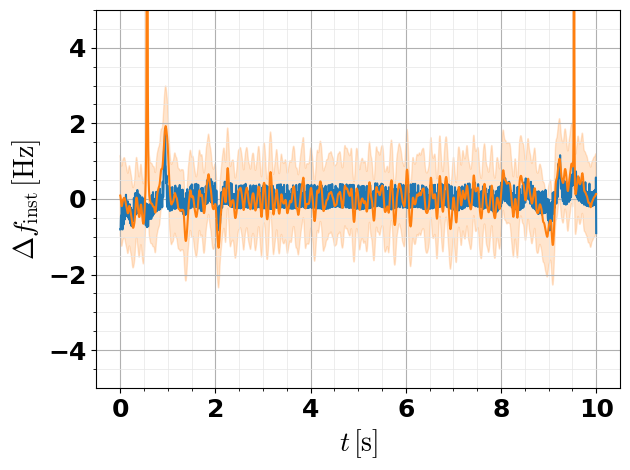

array([[ 86.20517241,  86.20517241,  86.20517241, ..., 100.42348838,
        104.16458333, 104.16458333],
       [ 17.42125436,  17.42125436,  17.42125436, ...,  21.73869565,
         21.73869565,  21.73869565],
       [108.69347826, 108.69347826, 108.69347826, ..., 121.34321636,
        131.57631579, 131.57631579]])

In [ ]:
b.PlotInstFreq(Ir[0],Ic[0],diff_freq=True,freq_type='hilbert')
b.PlotInstFreq(Ir[0],Ic[0],diff_freq=True,freq_type='zerocross')

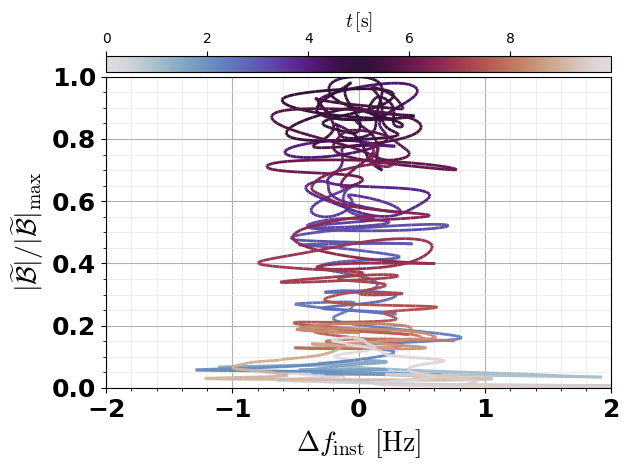

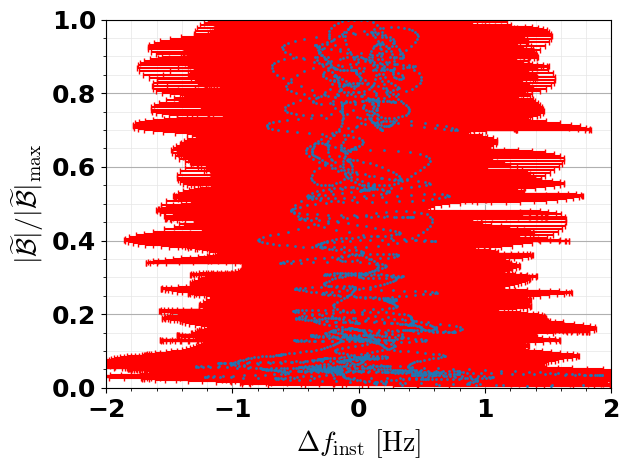

In [ ]:
_,_,_,_ = b.InstDiffFreq(Ir[0],Ic[0],fband=2.0,plot=True,err=False)
_,_,_,_ = b.InstDiffFreq(Ir[0],Ic[0],fband=2.0,plot=True,err=True)